<a href="https://colab.research.google.com/github/keshav-ml/plugin-data/blob/main/plugin_data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
def atoi(s):
    n = 0
    for i in s:
        print(n,"-",i)
        n = n*10 + ord(i) - ord("0")
    return n
atoi("2000")

0 - 2
2 - 0
20 - 0
200 - 0


2000

In [ ]:
set(["hello"])

{'hello'}

In [ ]:

!pip install textstat
!pip install textdistance 

     |████████████████████████████████| 102kB 3.7MB/s 
     |████████████████████████████████| 3.0MB 28kB/s 


In [ ]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import textstat as tx
import json
from tqdm import tqdm
import textdistance as td

In [ ]:
def rescale(values, new_min = 0, new_max = 127):
    values = [int(v) for v in values]
    output = []
    old_min, old_max = min(values), max(values)

    for v in values:
        new_v = (new_max - new_min) / (old_max - old_min) * (v - old_min) + new_min
        output.append(new_v)

    return output

In [ ]:
tags_data = pd.read_csv('../content/drive/My Drive/data/plugin_data/tags.csv')
#tags_id_nm_data = pd.read_csv('../content/drive/My Drive/data/plugin_data/tags_id_name.csv')
plugin_data = pd.read_csv('../content/drive/My Drive/data/plugin_data/plugin_data.csv')
processed_plugin = pd.read_csv('../content/drive/My Drive/data/plugin_data/processed_plugin.csv')
plugin_extra = pd.read_csv('../content/drive/My Drive/data/plugin_data/plugin_extra.csv')
n_tags_df = pd.read_csv('../content/drive/My Drive/data/plugin_data/n_tags_df.csv')
#mat_df = pd.read_csv('../content/drive/My Drive/data/plugin_data/sim_mat.csv')
plug_des = pd.read_csv('../content/drive/My Drive/data/plugin_data/plugins_description.csv',names=['id','description'])  
top_sorted_filter_tags  = pd.read_csv('../content/drive/My Drive/data/plugin_data/top_sorted.csv')


In [ ]:
top_un = pd.read_csv("../content/drive/My Drive/data/plugin_data/top_un_sorted.csv")

In [ ]:
top_un['plugin_data'] = top_un['plugin_data'].apply(lambda s: json.loads(s)) 

In [ ]:
for i,row in top_sorted_filter_tags.iterrows():
  data = {}
  for k,v in row['plugin_data']['install_count'].items():
    data[k] = v - (row['downloads'] / row['num_plugins'])
  row['plugin_data']['mean_diff'] = data

In [ ]:
top_full = pd.read_csv('../content/drive/My Drive/data/plugin_data/top_sorted_10.csv')

In [ ]:
for i,row in top_full.iterrows():
  for data in row['plugin_data']:
    data['mean_diff'] = data['install_count'] - (row['downloads'] / row['num_plugins'])

In [ ]:
for i in range(len(main_tags['id'])):
  data = main_tags['plugin_data'][i]
  data_df = pd.DataFrame(data,columns=data[0].keys())
  
  data_df = data_df.sort_values('install_count',ascending=False)
  data_df.drop_duplicates('title',inplace=True)
  data_df.replace(np.NaN,0,inplace=True)
  
  main_tags['plugin_data'][i] = data_df.to_dict()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
df = pd.DataFrame(top_full['plugin_data'][0],columns=top_full['plugin_data'][0][0].keys())
df = df[df['mean_diff'] <= 0]
max(df['install_count'])

20000.0

In [ ]:
top_sorted_filter_tags['plugin_data'][0].keys()

dict_keys(['title', 'description', 'rating', 'rating_count', 'install_count', 'download_rate', 'option', 'mean_diff', 'plug_id'])

In [ ]:
top_full['plugin_data'][0][0]

{'description': '\n\tDescription\n\tThis plugin resolves performance issues caused by brute force attacks described in the WordPress Codex here: https://codex.wordpress.org/Brute_Force_Attacks\n\nFrom WordPress Codex:\nDue to the nature of these attacks, you may find your server’s memory goes through the roof, causing performance problems. This is because the number of http requests (that is the number of times someone visits your site) is so high that servers run out of memory.\nA common attack point on WordPress is to hammer the wp-login.php file over and over until they get in or the server dies. You can do some things to protect yourself.\n\nProtection Against DDoS plugin addresses these issues very well.\nIt also allows to deny access to common WordPress features that get frequently attacked, like xmlrpc or RSS feeds pages.\nCloudFlare users can allow or deny access for visitors from specified countries.\nAll checks are done via the .htaccess file so that bogus requests can’t even

In [ ]:
top_full['plugin_data'] = top_full['plugin_data'].apply(lambda s: json.loads(s))

In [ ]:
top_sorted_filter_tags['plugin_data'][2]['mean_diff']

{'100': 77309.0306122449,
 '102': 27309.030612244896,
 '147': 47309.0306122449,
 '252': 4977309.030612245,
 '33': 7309.0306122448965,
 '44': 277309.0306122449,
 '45': 277309.0306122449,
 '46': 377309.0306122449,
 '67': 1977309.030612245,
 '68': 177309.0306122449}

In [ ]:
processed_plugin.drop(['stats','growth_rate','download_rate','description'],axis=1,inplace=True)

In [ ]:
processed_plugin = processed_plugin.merge(plugin_extra,on='id')

In [ ]:
processed_plugin = processed_plugin.merge(plug_des,on='id')

In [ ]:
processed_plugin.set_index('id',inplace=True)

In [ ]:
processed_plugin.head()

,id,title,rating,rating_count,install_count,author,tested_version,tags,stats,growth_rate,download_rate,description
0,1,Loco Translate,5.0,306,1000000.0,Tim Whitlock,5.2.5,1 2 3 4 5,"{'today': '1773', 'yesterday': '4748', 'last_w...","{""2019-07-07"":""+0.2"",""2019-07-14"":""+0.3"",""2019...","{'2019-07-04': '5376', '2019-07-05': '4610', '...",\n\tDescription\n\tLoco Translate provides in-...
1,2,Site Kit by Google,3.5,61,100000.0,Google,5.3.1,6 7 8 9 10,"{'today': '3269', 'yesterday': '7842', 'last_w...","{""2019-11-03"":""+250.6"",""2019-11-10"":""+42.1"",""2...","{'2019-07-04': '1', '2019-07-05': 0, '2019-07-...",\n\tDescription\n\tSite Kit is the official Wo...
2,3,WP Hotelier,4.5,9,3000.0,WP Hotelier,5.3.1,11 12 13 14 15,"{'today': '15', 'yesterday': '43', 'last_week'...","{""2019-07-07"":""+0.3"",""2019-07-14"":""+1.3"",""2019...","{'2019-07-04': '23', '2019-07-05': '24', '2019...",\n\tDescription\n\tWP Hotelier is a booking pl...
3,4,Conditional Discounts for WooCommerce,4.0,77,7000.0,ORION,5.3.1,16 17 18,"{'today': '44', 'yesterday': '118', 'last_week...","{""2019-07-07"":""+0.8"",""2019-07-14"":""+0.8"",""2019...","{'2019-07-04': '116', '2019-07-05': '97', '201...",\n\tDescription\n\tFormerly named “WooCommerce...
4,5,Private groups,5.0,39,3000.0,Robin Wilson,5.3.1,19 20 21 22 23,"{'today': '9', 'yesterday': '28', 'last_week':...","{""2019-07-07"":""-0.3"",""2019-07-14"":""-0.5"",""2019...","{'2019-07-04': '68', '2019-07-05': '48', '2019...",\n\tDescription\n\tAn add-on to the bbPress fo...


In [ ]:
processed_plugin['growth_rate'].replace(np.NaN,"",inplace=True)

In [ ]:
any([type(t) == str for t in processed_plugin['growth_rate']])

True

In [ ]:
for s in processed_plugin['growth_rate'].index:
  try:
    processed_plugin.loc[s,'growth_rate'] = json.loads(processed_plugin.loc[s,'growth_rate'])
  except:
    pass

In [ ]:
processed_plugin['stats'] = processed_plugin['stats'].apply(lambda s: json.loads(str(s).replace("\'","\"")))
processed_plugin['download_rate'] = processed_plugin['download_rate'].apply(lambda s: json.loads(str(s).replace("\'","\"")))
processed_plugin['growth_rate'] = processed_plugin['growth_rate'].apply(lambda s: json.loads(s))

TypeError: ignored

In [ ]:
processed_plugin['stats'] = processed_plugin['stats'].apply(lambda s: json.dumps(s))
processed_plugin['download_rate'] = processed_plugin['download_rate'].apply(lambda s: json.dumps(s))
processed_plugin['growth_rate'] = processed_plugin['growth_rate'].apply(lambda s: json.dumps(s))

In [ ]:
processed_plugin.to_csv('../content/drive/My Drive/data/plugin_data/processed_plugin.csv',index=False)

In [ ]:
n_lis = []
for idx in tags_data['id']:
  n_lis.append([len(t) for t in [title for title in processed_plugin['title'] for t_lis in processed_plugin['tags'] if idx in str(t_lis).split(' ')]])
  print(n_lis)
  break
#tags_data['num_plugins'] =  n_lis

KeyboardInterrupt: ignored

In [ ]:
plugin_extra['stats'][0]

'{"today":"1773","yesterday":"4748","last_week":"30031","all_time":"7317503"}'

In [ ]:
tags_data.head()

,id,name,num_plugins,downloads,rating_count,rating
0,6313,total cache,1,1000000.0,2850.000000,5.0
1,3560,convert webp,2,520000.0,2356.500000,5.0
2,5243,responsive gallery plugin,1,300000.0,1552.000000,5.0
3,7066,optimizing,1,900000.0,1100.000000,5.0
4,9499,display widgets,3,50000.0,615.666667,5.0


In [ ]:
mod_tags = tags_data[tags_data['downloads'] > 1000]
mod_tags = mod_tags[mod_tags['rating_count'] > 1000]

In [ ]:
mod_tags.reset_index(inplace=True)

In [ ]:
mod_tags

,index,id,name,num_plugins,downloads,rating_count,rating,plugin_data
0,0,6313,total cache,1,1000000.0000,2850.000000,5.000000,"{'title': ['WP Fastest Cache'], 'rating': [5.0..."
1,1,3560,convert webp,2,520000.0000,2356.500000,5.000000,"{'title': ['Smush – Compress, Optimize and Laz..."
2,2,5243,responsive gallery plugin,1,300000.0000,1552.000000,5.000000,"{'title': ['Responsive Lightbox & Gallery'], '..."
3,3,7066,optimizing,1,900000.0000,1100.000000,5.000000,"{'title': ['WP-Optimize – Clean, Compress, Cac..."
4,7685,3573,Content analysis,3,287953.3333,1537.944444,2.805556,{'title': ['Content Aware Sidebars – Unlimited...
5,10824,5203,maxcdn,3,500000.0000,2151.000000,2.250000,{'title': ['Remote Website Management Plugin b...
6,12473,6575,Readability,2,202154.8000,1083.400000,1.780000,{'title': ['Asset CleanUp: Page Speed Booster'...


In [ ]:
plugin_data.head(7)

,rating,rating_count,install_count,tags_ids,tags
0,5.0,306,1000000,[1 2 3 4 5],NaN
1,3.5,61,100000,[ 6 7 8 9 10],NaN
2,4.5,9,3000,[11 12 13 14 15],NaN
3,4.0,77,7000,[16 17 18],NaN
4,5.0,39,3000,[19 20 21 22 23],NaN
5,4.5,191,20000,[24 25 26 27 28],NaN
6,4.5,673,200000,[29 30 31 32 33],NaN


In [ ]:
processed_plugin.head(7)

,id,title,description,rating,rating_count,install_count,author,tested_version,tags
0,1,Loco Translate,Translate WordPress plugins and themes directl...,5.0,306,1000000.0,Tim Whitlock,5.2.5,1 2 3 4 5
1,2,Site Kit by Google,Site Kit is a one-stop solution for WordPress ...,3.5,61,100000.0,Google,5.3.1,6 7 8 9 10
2,3,WP Hotelier,WP Hotelier is a powerful WordPress booking pl...,4.5,9,3000.0,WP Hotelier,5.3.1,11 12 13 14 15
3,4,Conditional Discounts for WooCommerce,A powerful WooCommerce dynamic pricing plugin ...,4.0,77,7000.0,ORION,5.3.1,16 17 18
4,5,Private groups,For bbPress – Creates private forum groups,5.0,39,3000.0,Robin Wilson,5.3.1,19 20 21 22 23
5,6,Discount Rules for WooCommerce,"Create simple to complex discount rules, dynam...",4.5,191,20000.0,Flycart Technologies LLP,5.3.1,24 25 26 27 28
6,7,"Imagify – Convert WebP, Images Compression and...",Optimize images in one click: reduce image fil...,4.5,673,200000.0,WP Media,5.3.1,29 30 31 32 33


In [ ]:
ts = processed_plugin.copy()
test = ts[:5]
test

,id,title,description,rating,rating_count,install_count,author,tested_version,tags
0,1,Loco Translate,Translate WordPress plugins and themes directl...,5.0,306,1000000.0,Tim Whitlock,5.2.5,1 2 3 4 5
1,2,Site Kit by Google,Site Kit is a one-stop solution for WordPress ...,3.5,61,100000.0,Google,5.3.1,6 7 8 9 10
2,3,WP Hotelier,WP Hotelier is a powerful WordPress booking pl...,4.5,9,3000.0,WP Hotelier,5.3.1,11 12 13 14 15
3,4,Conditional Discounts for WooCommerce,A powerful WooCommerce dynamic pricing plugin ...,4.0,77,7000.0,ORION,5.3.1,16 17 18
4,5,Private groups,For bbPress – Creates private forum groups,5.0,39,3000.0,Robin Wilson,5.3.1,19 20 21 22 23


In [ ]:
processed_plugin = processed_plugin[processed_plugin['install_count'] > 1000]
processed_plugin = processed_plugin[processed_plugin['rating_count'] > 1000]

In [ ]:
processed_plugin['install_count'].replace(np.NaN,0,inplace=True)
processed_plugin['rating_count'].replace(np.NaN,0,inplace=True)

In [ ]:
print(processed_plugin.shape)
print(tags_data.shape)

(49120, 9)
(17799, 6)


In [ ]:
p_lis = []
c_lis = []
#d_lis =  []
#r_lis = []
s_lis = []
for idx in tqdm(range(len(tags_data['id']))):
  data = {}
  data['title'] = []
  #data['rating'] = []
  #data['rating_count'] = []
  data['install_count'] = []
  data['growth_rate'] = []
  data['download_rate'] = []
  data['stats'] = []
  #d_l = []
  #r_l = []
  for t_lis  in range(len(processed_plugin['tags'])):
    if str(top_sorted_filter_tags['id'][idx]) in str(processed_plugin['tags'][t_lis]).split(' '):
      data['title'].append(processed_plugin['title'][t_lis])
      #data['rating'].append(processed_plugin['rating'][t_lis])
      #data['rating_count'].append(processed_plugin['rating_count'][t_lis])
      data['install_count'].append(processed_plugin['install_count'][t_lis])
      data['growth_rate'].append(processed_plugin['growth_rate'][t_lis])
      data['stats'].append(processed_plugin['stats'][t_lis])
      data['download_rate'].append(processed_plugin['download_rate'][t_lis])
      #d_l.append(processed_plugin['install_count'][t_lis])
      #r_l.append(processed_plugin['rating_count'][t_lis])
  #c_lis.append(len(data['title']))
  #d_lis.append(sum(d_l))
  #r_lis.append(sum(r_l))

  p_df  = pd.DataFrame(data,columns=['title','install_count','growth_rate','download_rate','stats'])
  print(p_df.shape)
  p_df = p_df.sort_values('install_count',ascending=False)[:10]
  
  p_lis.append(p_df.to_dict())

top_sorted_filter_tags['plugin_data'] = p_lis
#top_sorted_filter_tags['num_plugins'] = c_lis
#tags_data['downloads'] = d_lis
#tags_data['rating_count'] = r_lis


  9%|▉         | 1/11 [00:00<00:09,  1.05it/s]

(262, 5)


 18%|█▊        | 2/11 [00:01<00:08,  1.05it/s]

(560, 5)


 27%|██▋       | 3/11 [00:02<00:07,  1.05it/s]

(830, 5)


 36%|███▋      | 4/11 [00:03<00:06,  1.05it/s]

(387, 5)


 45%|████▌     | 5/11 [00:04<00:05,  1.05it/s]

(859, 5)


 55%|█████▍    | 6/11 [00:05<00:04,  1.00it/s]

(2872, 5)


 64%|██████▎   | 7/11 [00:06<00:03,  1.02it/s]

(409, 5)


 73%|███████▎  | 8/11 [00:07<00:02,  1.03it/s]

(142, 5)


 82%|████████▏ | 9/11 [00:08<00:01,  1.04it/s]

(467, 5)


 91%|█████████ | 10/11 [00:09<00:00,  1.03it/s]

(942, 5)


100%|██████████| 11/11 [00:10<00:00,  1.03it/s]

(642, 5)


In [ ]:
tags_data.to_csv('../content/drive/My Drive/data/plugin_data/tags.csv',index=False)

In [ ]:
tags_data.head(10)

,id,name,num_plugins,downloads,rating_count,rating,plugin_data
0,6313,total cache,1,1000000.0,2850,5.0,"{'title': ['WP Fastest Cache'], 'rating': [5.0..."
1,3560,convert webp,2,1040000.0,4713,5.0,"{'title': ['Smush – Compress, Optimize and Laz..."
2,5243,responsive gallery plugin,1,300000.0,1552,5.0,"{'title': ['Responsive Lightbox & Gallery'], '..."
3,7066,optimizing,1,900000.0,1100,5.0,"{'title': ['WP-Optimize – Clean, Compress, Cac..."
4,9499,display widgets,3,150000.0,1847,5.0,{'title': ['Content Aware Sidebars – Unlimited...
5,8466,WordPress Management,3,313000.0,1769,5.0,{'title': ['Remote Website Management Plugin b...
6,5232,defer css javascript,2,130000.0,954,5.0,{'title': ['Asset CleanUp: Page Speed Booster'...
7,12159,custom columns,3,100120.0,1218,5.0,"{'title': ['Admin Columns', 'Simple Admin Colu..."
8,9488,wp-filemanager,2,530000.0,796,5.0,"{'title': ['File Manager', 'Advanced File Mana..."
9,9019,floating social media,2,30060.0,586,5.0,{'title': ['Social Media Flying Icons | Floati...


In [ ]:
tags_data[tags_data['name'] == 'seo']['downloads']

10319    14999700.0
Name: downloads, dtype: float64

In [ ]:
tags_data.sort_values(by='num_plugins', ascending=False,inplace=True)

In [ ]:
mod_tags[mod_tags['name'] == 'convert webp']['plugin_data']

1    {'title': ['Smush – Compress, Optimize and Laz...
Name: plugin_data, dtype: object

In [ ]:
tags_data.reset_index(inplace=True)

In [ ]:
for name in mod_tags['name']:
  fig = go.Figure()
  fig.add_trace(go.Bar(
      x = mod_tags[mod_tags['name'] == name]['plugin_data'].values[0]['title'],
      y = mod_tags[mod_tags['name'] == name]['plugin_data'].values[0]['install_count'],
      text = mod_tags[mod_tags['name'] == name]['plugin_data'].values[0]['install_count'],
      name = 'Downloads'
  ))
  fig.update_layout(title='Downloads of plugins of tag '+name)
  fig.show()

In [ ]:
for name in mod_tags['name']:
  fig = px.area()
  for dr in range(len(mod_tags[mod_tags['name'] == name]['plugin_data'].values[0]['download_rate'])):
    fig.add_scatter(
        x = list(mod_tags[mod_tags['name'] == name]['plugin_data'].values[0]['download_rate'][dr].keys()),
        y = rescale(list(mod_tags[mod_tags['name'] == name]['plugin_data'].values[0]['download_rate'][dr].values()),0,1),
        text=list(mod_tags[mod_tags['name'] == name]['plugin_data'].values[0]['download_rate'][dr].values()),
        mode='lines',
        name=mod_tags[mod_tags['name'] == name]['plugin_data'].values[0]['title'][dr],
        fill='tozeroy'
    )
  fig.update_layout(title='downloads of plugins with tag '+name,showlegend=True)
  fig.show()

In [ ]:
l = ['1','2']


AttributeError: ignored

In [ ]:
print(plugin_data.shape)
print( processed_plugin.shape)

(49120, 5)
(49120, 8)


In [ ]:
download_data = tags_data.sort_values(by='downloads').reset_index()
download_data.head(10)

,index,id,name,num_plugins,downloads,rating_count,rating,plugins
0,17798,14371,ereader,30,0.0,0.0,0.0,"array('Kindle-DX-3-Graphite-Widget', dtype=obj..."
1,1801,7415,validity,2,0.0,1.0,5.0,"array('Links synthesis', dtype=object), array(..."
2,1802,10022,online appointment scheduling software,2,0.0,1.0,5.0,array('TimePicks – Online Appointment Booking ...
3,1803,10104,login-logout,2,0.0,1.0,5.0,"array('Login Logout Shortcode Simple', dtype=o..."
4,1804,12487,odesk,2,0.0,1.0,5.0,"array('Odesk Profile Fetcher', dtype=object), ..."
5,1805,12579,rsv,2,0.0,1.0,5.0,"array('RSV GMaps', dtype=object), array('RSV M..."
6,1806,13379,phando,2,0.0,1.0,5.0,"array('Phando Video Player', dtype=object), ar..."
7,1800,6847,to display a message,2,0.0,1.0,5.0,"array('Notification msg interface benaceur', d..."
8,1807,13700,opening,2,0.0,1.0,5.0,"array('Storehours', dtype=object), array('Open..."
9,1809,15196,fulfilment,2,0.0,1.0,5.0,"array('WooCommerce I-Fulfilment Integration', ..."


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f33a1b759e8>]],
      dtype=object)

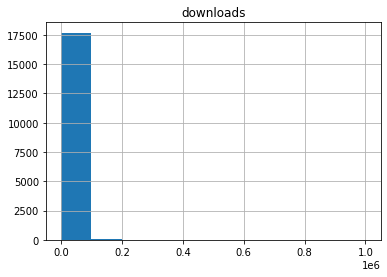

In [ ]:
download_data.hist('downloads')

In [ ]:
download_data.replace(0,np.NaN,inplace=True)
download_data.dropna(inplace=True)

In [ ]:
download_data = download_data[download_data['downloads'] > 1000]

In [ ]:
download_data = download_data[download_data['rating_count'] > 500]

In [ ]:
download_data

,index,id,name,num_plugins,downloads,rating_count,rating,plugins
17092,2503.0,6363,wordpress slideshow gallery,1,20000.0000,729.000000,4.500000,"array('Slideshow Gallery', dtype=object)"
17562,4.0,9499,display widgets,3,50000.0000,615.666667,5.000000,array('Content Aware Sidebars – Unlimited Widg...
17590,5032.0,3548,wordpress xml import,2,50500.0000,671.000000,3.500000,array('Import any XML or CSV File to WordPress...
17641,3710.0,5205,post notification,6,67000.0000,685.166667,4.083333,"array('Email Subscribers & Newsletters', dtype..."
17686,2502.0,9155,font uploader,1,100000.0000,830.000000,4.500000,"array('Use Any Font Freemium ', dtype=object)"
17708,5.0,8466,WordPress Management,3,104333.3333,589.666667,5.000000,array('Remote Website Management Plugin by Wat...
17717,4841.0,31,optimize images,10,122199.0000,536.900000,3.650000,"array('Imagify – Convert WebP, Images Compress..."
17749,11651.0,3406,transfer,11,183701.8182,563.818182,2.045455,"array('PS_User Copy', dtype=object), array('Al..."
17757,12473.0,6575,Readability,25,202154.8000,1083.400000,1.780000,array('SEO Writing Assistant SEMrush Custom Fi...
17762,5405.0,1354,xml sitemap,31,241810.3226,923.161290,3.483871,"array('XML Sitemap & Google News', dtype=objec..."


In [ ]:
fig = go.Figure()
fig.add_trace(go.Bar(
                     x=rescale(download_data['downloads'],0,1),
                     y=download_data['name'],
                     text=download_data['downloads'],
                     name='Downolads',
                     orientation='h'
              ))
fig.update_layout(height=700,title='Wordpress Plugin tags that have highest downloads')
fig.show()

In [ ]:
fig = go.Figure()
fig.add_trace(go.Bar(
                     x=download_data['name'],
                     y=rescale(download_data['rating'],0,1),
                     text=download_data['rating'],
                     name='Ratings',
                     
              ))
fig.update_layout(height=700,title='Wordpress Plugin tags that have highest Ratings')
fig.show()

In [ ]:
processed_plugin['redablity_des'] = [tx.flesch_reading_ease(str(s)) for s in processed_plugin['description']]
processed_plugin['sent_count_des'] = [tx.sentence_count(str(s)) for s in processed_plugin['description']]
processed_plugin['redablity_title'] = [tx.flesch_reading_ease(str(s)) for s in processed_plugin['title']]
processed_plugin['sent_count_title'] = [tx.sentence_count(str(s)) for s in processed_plugin['title']]

In [ ]:
plugin_stat = processed_plugin[['rating','rating_count','install_count','redablity_des','sent_count_des','redablity_title','sent_count_title']]

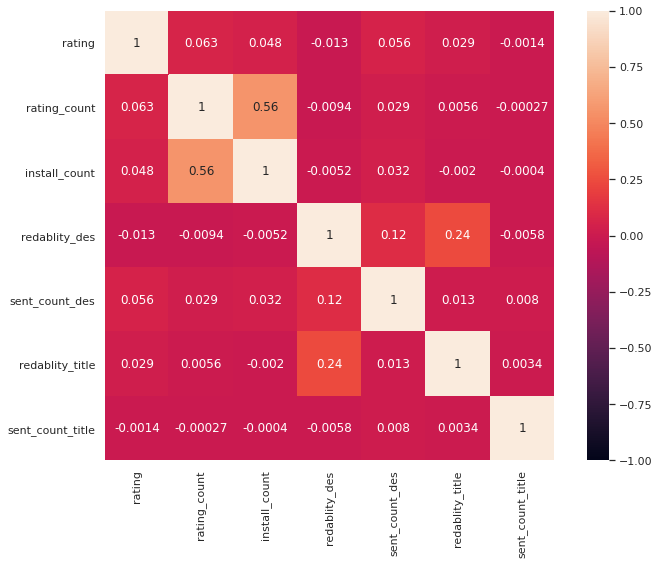

In [ ]:
import seaborn as sns
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.heatmap(plugin_stat.corr(),vmax=1,vmin=-1,annot=True,square=True)

In [ ]:
plugin_stat = processed_plugin[processed_plugin['install_count'] > 1000]
plugin_stat = plugin_stat[plugin_stat['rating_count'] > 1000]

In [ ]:
plugin_data.shape

(56, 5)

In [ ]:
processed_plugin.sort_values(by='install_count',ascending=False,inplace=True)

In [ ]:
!mv 'processed_plugin.csv' '../content/drive/My Drive/data/plugin_data/'

In [ ]:
processed_plugin.head(10)

,id,title,description,rating,rating_count,install_count,author,tested_version,redablity_des,sent_count_des,redablity_title,sent_count_title
2397,2398,WooCommerce,"WooCommerce is a flexible, open-source eCommer...",4.5,3442,5000000.0,Automattic,5.3.1,62.85,2,36.62,1
12748,12749,Yoast SEO,Improve your WordPress SEO: Write better conte...,5.0,27036,5000000.0,Team Yoast,5.3.1,60.65,1,120.21,1
33185,33186,Classic Editor,"Enables the previous ""classic"" editor and the ...",5.0,749,5000000.0,WordPress Contributors,5.3.2,59.80,2,-6.70,1
14429,14430,Jetpack by WordPress.com,"The ideal plugin for stats, related posts, sea...",4.0,1454,5000000.0,Automattic,5.3.1,28.84,1,34.59,1
14326,14327,Akismet Anti-Spam,Akismet checks your comments and contact form ...,4.5,843,5000000.0,Automattic,5.3.1,56.59,1,-6.70,1
14426,14427,Contact Form 7,Just another contact form plugin. Simple but f...,4.0,1689,5000000.0,Takayuki Miyoshi,5.3.1,42.04,2,93.81,1
24379,24380,WordPress Importer,"Import posts, pages, comments, custom fields, ...",3.0,287,4000000.0,wordpressdotorg,5.2.5,64.71,1,35.61,1
4222,4223,Really Simple SSL,No setup required! You only need an SSL certif...,5.0,3008,3000000.0,"Rogier Lankhorst, Mark Wolters",5.3.1,80.28,2,34.59,1
1367,1368,Elementor Page Builder,The most advanced frontend drag & drop page bu...,5.0,4649,3000000.0,Elementor.com,5.3.1,80.99,3,34.59,1
4279,4280,Duplicate Post,Copy posts of any type with a click!,5.0,422,3000000.0,Enrico Battocchi,5.3.1,114.12,1,35.61,1


#**Analysis**


In [ ]:
tags_data.dtypes

id                int64
name             object
num_plugins       int64
downloads       float64
rating_count      int64
rating          float64
plugin_data      object
dtype: object

In [ ]:
len(tags_data['plugin_data'][1].replace("\'","\""))

13755

In [ ]:
tags_data['plugin_data'].describe()

count                                                 17799
unique                                                16645
top       {'title': ['GeoDirectory – Genesis Compatibili...
freq                                                     10
Name: plugin_data, dtype: object

In [ ]:
tags_data.shape

(17799, 7)

In [ ]:
tags_data['plugin_data'] = tags_data['plugin_data'].apply(lambda s: json.loads(str(s).replace("\'","\"")))

JSONDecodeError: ignored

In [ ]:
filter_tags = tags_data[tags_data['downloads'] > 1000]
filter_tags.head()
print(filter_tags.shape)

(8241, 7)


In [ ]:
sorted_filter_tags = filter_tags.sort_values('downloads')

In [ ]:
sorted_filter_tags.head(20)

,id,name,num_plugins,downloads,rating_count,rating,plugin_data
12820,1308,bullet,3,1010.0,5,1.666667,{'title': ['WP 3.9 Style Visual Editor Bullete...
13260,3239,sign,7,1010.0,8,1.571429,"{'title': ['D-login', 'Inactivity Auto Sign Ou..."
13452,8808,news slider,6,1010.0,9,1.500000,"{'title': ['NewsBoard Post and RSS Scroller', ..."
13583,15888,qr widget,3,1010.0,2,1.500000,"{'title': ['Simple QR Code', 'Qr Code Adv', 'E..."
12629,7882,wp-config,8,1010.0,9,1.750000,"{'title': ['WP Configuration and Status', 'WP ..."
12340,10078,lifterlms,8,1010.0,7,1.875000,{'title': ['Attendance Management For LifterLM...
14458,6204,brightcove,4,1020.0,5,0.875000,"{'title': ['Nucleora Brightcove Importer', 'Br..."
3092,4880,yandex maps,2,1020.0,6,4.500000,"{'title': ['Maps for WP', 'Many points on the ..."
10897,5245,payperpost,2,1020.0,31,2.250000,"{'title': ['WooCommerce Pay Per Post', 'PaidCo..."
11952,5687,Admin page,7,1020.0,14,2.000000,"{'title': ['Zeus WordPress Admin', 'Peasy Admi..."


In [ ]:
top_sorted_filter_tags.reset_index(inplace=True)

In [ ]:
sorted_filter_tags['plugin_data'][0].replace("\'","\"")[2570:]

In [ ]:
top_sorted_filter_tags = sorted_filter_tags[-11:].copy()

In [ ]:
top_sorted_filter_tags.drop('index',inplace=True,axis=1)

In [ ]:
top_sorted_filter_tags

,id,name,num_plugins,downloads,rating_count,rating,plugin_data
0,32,performance,262,7803050.0,11194,3.003817,"{'title': {22: 'WP Super Cache', 51: 'Autoptim..."
1,207,e-commerce,1390,16509750.0,16977,2.215437,"{'title': {14: 'WooCommerce', 17: 'WooCommerce..."
3,309,gutenberg,387,8893510.0,3656,2.364341,"{'title': {248: 'Classic Editor', 63: 'TinyMCE..."
4,158,email,859,9320290.0,13130,2.394645,"{'title': {243: 'Contact Form 7', 48: 'MC4WP: ..."
5,128,widget,2872,9480320.0,13763,1.997391,"{'title': {632: 'Page Builder by SiteOrigin', ..."
6,216,contact form,409,11092380.0,14924,2.914425,"{'title': {143: 'Contact Form 7', 45: 'Contact..."
7,345,backup,142,13116870.0,18785,2.728873,"{'title': {52: 'Jetpack by WordPress.com', 4: ..."
8,282,editor,467,13809270.0,9935,2.703426,"{'title': {283: 'Classic Editor', 20: 'Element..."
9,175,seo,942,14999700.0,42017,2.444268,"{'title': {214: 'Yoast SEO', 28: 'All in One S..."
10,97,security,642,16896040.0,17904,2.668740,"{'title': {207: 'Jetpack by WordPress.com', 10..."


In [ ]:
top_sorted_filter_tags['name']

0      performance
1       e-commerce
3        gutenberg
4            email
5           widget
6     contact form
7           backup
8           editor
9              seo
10        security
Name: name, dtype: object

In [ ]:
top_sorted_filter_tags.drop([2],axis=0,inplace=True)

In [ ]:
e_1_df = pd.DataFrame(top_sorted_filter_tags['plugin_data'][1],columns=top_sorted_filter_tags['plugin_data'][1].keys())
e_2_df = pd.DataFrame(top_sorted_filter_tags['plugin_data'][2],columns=top_sorted_filter_tags['plugin_data'][2].keys())

In [ ]:
e_1_df

,title,install_count,growth_rate,download_rate,stats
14,WooCommerce,5000000.0,"{""2019-07-07"":""+0.1"",""2019-07-14"":""+0.2"",""2019...","{'2019-07-04': '93911', '2019-07-05': '72115',...","{'today': '32889', 'yesterday': '76412', 'last..."
17,WooCommerce PayPal Checkout Payment Gateway,900000.0,"{""2019-07-07"":""-0.0"",""2019-07-14"":""+0.0"",""2019...","{'2019-07-04': '7222', '2019-07-05': '6683', '...","{'today': '2906', 'yesterday': '6362', 'last_w..."
16,WooCommerce Admin,800000.0,"{""2019-07-07"":""+9.5"",""2019-07-14"":""+11.1"",""201...","{'2019-07-04': '11320', '2019-07-05': '9817', ...","{'today': '9281', 'yesterday': '23582', 'last_..."
7,YITH WooCommerce Wishlist,700000.0,"{""2019-07-07"":""+0.0"",""2019-07-14"":""+0.0"",""2019...","{'2019-07-04': '5401', '2019-07-05': '4827', '...","{'today': '3239', 'yesterday': '7011', 'last_w..."
24,WooCommerce PayPal Powered by Braintree Paymen...,60000.0,"{""2019-07-07"":""-0.4"",""2019-07-14"":""-0.6"",""2019...","{'2019-07-04': '250', '2019-07-05': '307', '20...","{'today': '169', 'yesterday': '414', 'last_wee..."
19,Easy Digital Downloads,60000.0,"{""2019-07-07"":""-0.1"",""2019-07-14"":""-0.2"",""2019...","{'2019-07-04': '1590', '2019-07-05': '1322', '...","{'today': '466', 'yesterday': '1048', 'last_we..."
18,TI WooCommerce Wishlist,50000.0,"{""2019-07-07"":""+0.5"",""2019-07-14"":""+0.8"",""2019...","{'2019-07-04': '412', '2019-07-05': '393', '20...","{'today': '363', 'yesterday': '656', 'last_wee..."
15,Enhanced Ecommerce Google Analytics Plugin for...,30000.0,"{""2019-07-07"":""+0.1"",""2019-07-14"":""+0.1"",""2019...","{'2019-07-04': '544', '2019-07-05': '603', '20...","{'today': '211', 'yesterday': '458', 'last_wee..."
31,Ecwid Ecommerce Shopping Cart,30000.0,"{""2019-07-07"":""+0.1"",""2019-07-14"":""-0.3"",""2019...","{'2019-07-04': '475', '2019-07-05': '556', '20...","{'today': '112', 'yesterday': '260', 'last_wee..."
29,WP Image Zoom,20000.0,"{""2019-07-07"":""-0.1"",""2019-07-14"":""-0.0"",""2019...","{'2019-07-04': '271', '2019-07-05': '207', '20...","{'today': '136', 'yesterday': '194', 'last_wee..."


In [ ]:
e_3_df = pd.concat([e_1_df,e_2_df])


In [ ]:
e_3_df.drop([30,31,32,34,38],axis=0,inplace=True)

In [ ]:
e_3_df = e_3_df.sort_values('install_count',ascending=False)[:10]

In [ ]:
top_sorted_filter_tags.loc[1,'num_plugins'] += top_sorted_filter_tags.loc[2,'num_plugins']
top_sorted_filter_tags.loc[1,'downloads'] += top_sorted_filter_tags.loc[2,'downloads']
top_sorted_filter_tags.loc[1,'rating_count'] += top_sorted_filter_tags.loc[2,'rating_count']

In [ ]:
top_sorted_filter_tags.loc[1,'rating'] = np.mean([top_sorted_filter_tags.loc[1,'rating'],top_sorted_filter_tags.loc[2,'rating']])

In [ ]:
top_sorted_filter_tags.loc[1,'plugin_data'] = [e_3_df.to_dict()]

In [ ]:
top_sorted_filter_tags

,id,name,num_plugins,downloads,rating_count,rating,plugin_data
0,32,performance,262,7803050.0,11194,3.003817,"{'title': {22: 'WP Super Cache', 51: 'Autoptim..."
1,207,e-commerce,1390,16509750.0,16977,2.215437,"{'title': {14: 'WooCommerce', 17: 'WooCommerce..."
3,309,gutenberg,387,8893510.0,3656,2.364341,"{'title': {248: 'Classic Editor', 63: 'TinyMCE..."
4,158,email,859,9320290.0,13130,2.394645,"{'title': {243: 'Contact Form 7', 48: 'MC4WP: ..."
5,128,widget,2872,9480320.0,13763,1.997391,"{'title': {632: 'Page Builder by SiteOrigin', ..."
6,216,contact form,409,11092380.0,14924,2.914425,"{'title': {143: 'Contact Form 7', 45: 'Contact..."
7,345,backup,142,13116870.0,18785,2.728873,"{'title': {52: 'Jetpack by WordPress.com', 4: ..."
8,282,editor,467,13809270.0,9935,2.703426,"{'title': {283: 'Classic Editor', 20: 'Element..."
9,175,seo,942,14999700.0,42017,2.444268,"{'title': {214: 'Yoast SEO', 28: 'All in One S..."
10,97,security,642,16896040.0,17904,2.668740,"{'title': {207: 'Jetpack by WordPress.com', 10..."


In [ ]:
top_sorted_filter_tags.to_csv('')

,id,name,num_plugins,downloads,rating_count,rating,plugin_data
0,32,performance,262,7803050.0,11194,3.003817,"{'title': ['Imagify – Convert WebP, Images Com..."
1,207,e-commerce,560,7980460.0,6744,2.237500,{'title': ['WooCommerce – Customer Who Viewed ...
2,265,ecommerce,830,8529290.0,10233,2.193373,"{'title': ['Omnisend for WooCommerce', 'WordPr..."
3,309,gutenberg,387,8893510.0,3656,2.364341,"{'title': ['MathML Block', 'Testimonials Block..."
4,158,email,859,9320290.0,13130,2.394645,"{'title': ['Popup, Optin Form, Email Newslette..."
5,128,widget,2872,9480320.0,13763,1.997391,"{'title': ['Ultimate Addons for SiteOrigin', '..."
6,216,contact form,409,11092380.0,14924,2.914425,{'title': ['Caldera Forms – More Than Contact ...
7,345,backup,142,13116870.0,18785,2.728873,"{'title': ['mk Simple Backups', 'WP-DB-Backup'..."
8,282,editor,467,13809270.0,9935,2.703426,{'title': ['Enhanced Blocks – Page Builder Blo...
9,175,seo,942,14999700.0,42017,2.444268,{'title': ['SEO A/B Split Testing: Google Sear...


In [ ]:
e_3_df

,title,install_count,growth_rate,download_rate,stats
14,WooCommerce,5000000.0,"{""2019-07-07"":""+0.1"",""2019-07-14"":""+0.2"",""2019...","{'2019-07-04': '93911', '2019-07-05': '72115',...","{'today': '32889', 'yesterday': '76412', 'last..."
17,WooCommerce PayPal Checkout Payment Gateway,900000.0,"{""2019-07-07"":""-0.0"",""2019-07-14"":""+0.0"",""2019...","{'2019-07-04': '7222', '2019-07-05': '6683', '...","{'today': '2906', 'yesterday': '6362', 'last_w..."
16,WooCommerce Admin,800000.0,"{""2019-07-07"":""+9.5"",""2019-07-14"":""+11.1"",""201...","{'2019-07-04': '11320', '2019-07-05': '9817', ...","{'today': '9281', 'yesterday': '23582', 'last_..."
7,YITH WooCommerce Wishlist,700000.0,"{""2019-07-07"":""+0.0"",""2019-07-14"":""+0.0"",""2019...","{'2019-07-04': '5401', '2019-07-05': '4827', '...","{'today': '3239', 'yesterday': '7011', 'last_w..."
35,Mailchimp for WooCommerce,700000.0,"{""2019-07-07"":""+0.6"",""2019-07-14"":""+0.9"",""2019...","{'2019-07-04': '7917', '2019-07-05': '6915', '...","{'today': '4913', 'yesterday': '11171', 'last_..."
171,Sumo – Boost Conversion and Sales,100000.0,"{""2019-07-07"":""-0.4"",""2019-07-14"":""-0.5"",""2019...","{'2019-07-04': '667', '2019-07-05': '623', '20...","{'today': '187', 'yesterday': '321', 'last_wee..."
77,WordPress Download Manager,100000.0,"{""2019-07-07"":""+0.1"",""2019-07-14"":""+0.1"",""2019...","{'2019-07-04': '2751', '2019-07-05': '2127', '...","{'today': '834', 'yesterday': '1737', 'last_we..."
24,Paid Memberships Pro,80000.0,"{""2019-07-07"":""+0.1"",""2019-07-14"":""+0.0"",""2019...","{'2019-07-04': '638', '2019-07-05': '631', '20...","{'today': '518', 'yesterday': '1173', 'last_we..."
24,WooCommerce PayPal Powered by Braintree Paymen...,60000.0,"{""2019-07-07"":""-0.4"",""2019-07-14"":""-0.6"",""2019...","{'2019-07-04': '250', '2019-07-05': '307', '20...","{'today': '169', 'yesterday': '414', 'last_wee..."
19,Easy Digital Downloads,60000.0,"{""2019-07-07"":""-0.1"",""2019-07-14"":""-0.2"",""2019...","{'2019-07-04': '1590', '2019-07-05': '1322', '...","{'today': '466', 'yesterday': '1048', 'last_we..."


In [ ]:
top_sorted_filter_tags.loc[1,'plugin_data']

'{\'title\': [\'WooCommerce – Customer Who Viewed This Item Also Viewed\', \'WP eCommerce Wishlist\', \'BBA Mastro Plugin\', \'WooCommerce Yellow\', \'PrestaShop Integration\', \'WooCommerce and 1C:Enterprise/1С:Предприятие Data Exchange\', \'Conversion Tracking for WooCommerce\', \'YITH WooCommerce Wishlist\', \'PayGreen\', \'Woocommerce Gift Wrapper\', \'WooLayout\', \'Woo Icon Stock\', \'WooCommerce Stellar\', \'Shopp Improved\', \'WooCommerce\', \'Enhanced Ecommerce Google Analytics Plugin for WooCommerce\', \'WooCommerce Admin\', \'WooCommerce PayPal Checkout Payment Gateway\', \'TI WooCommerce Wishlist\', \'Easy Digital Downloads\', \'Welcart e-Commerce\', \'eCommerce Product Catalog Plugin for WordPress\', \'WooCommerce P.IVA e Codice Fiscale per Italia\', \'WordPress PayPal\', \'WooCommerce PayPal Powered by Braintree Payment Gateway\', \'Klarna Checkout for WooCommerce\', \'WC – APG Weight Shipping\', \'Klarna Payments for WooCommerce\', \'WP eCommerce\', \'WP Image Zoom\', \'

In [ ]:
top_sorted_filter_tags.loc[1,'plugin_data']+=top_sorted_filter_tags.loc[2,'plugin_data']

ERROR! Session/line number was not unique in database. History logging moved to new session 63


In [ ]:
len(top_sorted_filter_tags.loc[1,'plugin_data']['title'].values())

TypeError: ignored

In [ ]:
tot_plugins = plugin_data.shape[0]

In [ ]:
!orca --help

/bin/bash: orca: command not found


In [ ]:
help(go.Figure())

In [ ]:
from plotly import offline
plotly.offline.init_notebook_mode()


In [ ]:
help(plotly.offline.iplot())

Help on NoneType object:

class NoneType(object)
 |  Methods defined here:
 |  
 |  __bool__(self, /)
 |      self != 0
 |  
 |  __new__(*args, **kwargs) from builtins.type
 |      Create and return a new object.  See help(type) for accurate signature.
 |  
 |  __repr__(self, /)
 |      Return repr(self).



In [ ]:
fig = go.Figure()


fig.add_trace(go.Bar(
                     y=top_sorted_filter_tags['downloads'],
                     x=top_sorted_filter_tags['name'],
                     text=top_sorted_filter_tags['downloads'],
                     name='Downolads',
                     
                     textposition='auto'
              ))
fig.update_layout(height=700,width=1200,
                  title='Wordpress Plugin tags that have highest downloads'
                  
                  


)

fig.show()

In [ ]:
fig.to_dict()['layout'].keys()

dict_keys(['template', 'height', 'width', 'title'])

In [ ]:
figs = list(zip(['a','b'],[1,2]))

In [ ]:
figs

[('a', 1), ('b', 2)]

In [ ]:
!mkdir 'plugin_plots'

In [ ]:
fig = go.Figure()
top_sorted_filter_tags = top_sorted_filter_tags.sort_values('num_plugins')
colors = ['lightslategray',]* 10
colors[7],colors[8],colors[9] ='dodgerblue','dodgerblue','dodgerblue'
fig.add_trace(go.Bar(
                     x=top_sorted_filter_tags['num_plugins'], 
                     y=top_sorted_filter_tags['name'],
                     text=top_sorted_filter_tags['num_plugins'],
                     name='No of plugins',
                     textposition='auto',
                     orientation='h',
                     marker_color=colors
              ))
fig.update_layout(height=700,width=1200,title='Number of Wordpress Plugins in Specific Tags')
pof.plot(fig,filename='plugin_plots/Number of Wordpress Plugins in Specific Tags.png',image='png')
#py.plot(fig,filename='Number of Wordpress Plugins in Specific Tags')
fig.show()

/usr/local/lib/python3.6/dist-packages/plotly/offline/offline.py:562: UserWarning:

Your filename `plugin_plots/Number of Wordpress Plugins in Specific Tags.png` didn't end with .html. Adding .html to the end of your file.



In [ ]:
top_sorted = top_sorted_filter_tags.sort_values('num_plugins')

In [ ]:
fig = go.Figure()
colors = ['lightslategray',]* 10
colors[7],colors[8],colors[9] ='dodgerblue','dodgerblue','dodgerblue'
fig.add_trace(go.Bar(
                     x=top_sorted['num_plugins'],
                     y=top_sorted['name'],
                     text=[round((v/tot_plugins) * 100,2) for v in  top_sorted['num_plugins']],
                     name='num_plugins',
                     textposition='auto',
                     orientation='h',
                     marker_color=colors
                     
              ))
fig.update_layout(height=700,width=1200,title='% of Wordpress plugins in Tags')
#py.plot(fig,filename='% of Wordpress plugins in Tags')


fig.show()

In [ ]:
top_sorted_filter_tags

,id,name,num_plugins,downloads,rating_count,rating,plugin_data,keywords_data
0,32,performance,275,7831420.0,11194,3.003817,"{'title': ['Protection Against DDoS', 'Strictl...","{'downloads': {'Cache': 4155440.0, 'WP': 31306..."
1,207,e-commerce,4750,25115040.0,16977,2.215437,"{'title': ['WooCommerce SEO', 'Auto eCommerce ...","{'downloads': {'WooCommerce': 23027110.0, 'Gat..."
2,309,gutenberg,392,8894860.0,3656,2.364341,"{'title': ['FAQ Block For Gutenberg', 'Helpie ...","{'downloads': {'Editor': 5048150.0, 'Classic':..."
3,158,email,1162,11307440.0,13130,2.394645,"{'title': ['WP Test Email', 'Call Now, Email, ...","{'downloads': {'Form': 5401170.0, 'Contact': 5..."
4,128,widget,3398,14180260.0,13763,1.997391,"{'title': ['Social Media Widget by Acurax', 'U...","{'downloads': {'Widget': 4885130.0, 'SiteOrigi..."
5,216,contact form,873,17130200.0,14924,2.914425,{'title': ['Best Contact Management Software f...,"{'downloads': {'Form': 21122220.0, 'Contact': ..."
6,345,backup,197,13959770.0,18785,2.728873,{'title': ['Backup and Staging by WP Time Caps...,"{'downloads': {'by': 5084240.0, 'WordPress.com..."
7,282,editor,637,14198870.0,9935,2.703426,"{'title': ['f(x) Editor', 'tinyWYM Editor', 'F...","{'downloads': {'Editor': 6044460.0, 'Classic':..."
8,175,seo,942,14999700.0,42017,2.444268,{'title': ['SEO A/B Split Testing: Google Sear...,"{'downloads': {'SEO': 8078410.0, 'Yoast': 5272..."
9,97,security,665,16976800.0,17904,2.668740,"{'title': ['Website File Changes Monitor', 'Fi...","{'downloads': {'Security': 6436940.0, 'by': 52..."


In [ ]:
!pip install fuzzywuzzy

In [ ]:
from fuzzywuzzy import fuzz
data  = top_sorted_filter_tags['plugin_data'][8]
data_df = pd.DataFrame(data,columns=data.keys())
data_df['sim_val'] = [fuzz.partial_ratio('Yoast SEO'.lower(),t.lower()) for t in data_df['title']]
final_df = data_df[data_df['sim_val'] == 100].sort_values('install_count')[-10:]

In [ ]:
fig = px.area()
for k,v in final_df['download_rate'].items():
  inter_df = pd.DataFrame({'Date':list(v.keys()),'value':list(v.values())},columns=['Date','value'])
  inter_df['Date'] = inter_df['Date'].apply(lambda s: pd.to_datetime(s))
  inter_df['value'] = inter_df['value'].apply(lambda s: int(s))

  inter_df = inter_df.resample('M',on='Date').sum()
  fig.add_scatter(
      x=list(inter_df.index),
      y =inter_df['value'],
      text = inter_df['value'],
      name=final_df['title'][k],
      mode='lines'

  )
fig.update_layout(title='Downloads of plugins that contains Yoast SEO',showlegend=True)
fig.show()

In [ ]:
top_sorted_filter_tags['plugin_data'] = top_sorted_filter_tags['plugin_data'].apply(lambda s: json.loads(s))
top_sorted_filter_tags['keywords_data'] = top_sorted_filter_tags['keywords_data'].apply(lambda s: json.loads(s))

In [ ]:
data = pd.DataFrame(top_sorted_filter_tags['plugin_data'][0],columns=top_sorted_filter_tags['plugin_data'][0].keys())

In [ ]:
d = {'a':2,'b':90}
for k,v in d:
  print(k,v)

ValueError: ignored

In [ ]:
for i in range(len(top_sorted_filter_tags['plugin_data'])):
  for k,v in top_sorted_filter_tags['plugin_data'][i]['growth_rate'].items():
    top_sorted_filter_tags['plugin_data'][i]['growth_rate'][k] = json.loads(v)

In [ ]:
for i in range(len(top_sorted_filter_tags['id'])):
  data = top_sorted_filter_tags['plugin_data'][i]
  data_df = pd.DataFrame(data,columns=data[0].keys())
  data_df = data_df[data_df['mean_diff'] <= 0]
  data_df = data_df.sort_values('install_count',ascending=False)
  data_df.drop_duplicates('title',inplace=True)
  data_df.replace(np.NaN,0,inplace=True)
  data_df = data_df[:10]
  top_sorted_filter_tags['plugin_data'][i] = data_df.to_dict()

NameError: ignored

In [ ]:
d = [{'a':0,'b':9},{'a':2,'b':90}]
da = pd.DataFrame(d,columns=['a','b'])
json.dumps(da.to_dict())

'{"a": {"0": 0, "1": 2}, "b": {"0": 9, "1": 90}}'

In [ ]:
help(pd.DataFrame().to_dict)

In [ ]:
top_sorted_filter_tags['plugin_data'][1]['title']

{91: 'YITH WooCommerce Wishlist',
 490: 'WooCommerce Services',
 3140: 'WooCommerce',
 3142: 'WooCommerce Admin',
 3143: 'WooCommerce PayPal Checkout Payment Gateway',
 3721: 'WooCommerce',
 3722: 'WooCommerce Admin',
 3723: 'WooCommerce PayPal Checkout Payment Gateway',
 3726: 'Mailchimp for WooCommerce',
 4528: 'WooCommerce PayPal Checkout Payment Gateway'}

In [ ]:
colors = ['lightslategray',]* 10
colors[7],colors[8],colors[9] ='dodgerblue','dodgerblue','dodgerblue'
for i in range(len(top_sorted_filter_tags['name'])):
  fig = go.Figure()
  
  fig.add_trace(go.Bar(
      x = list(top_sorted_filter_tags['plugin_data'][i]['install_count'].values()),
      y = [' '.join(v.split(' ')[:4]) for v in  list(top_sorted_filter_tags['plugin_data'][i]['title'].values())], 
      text = [round((v/top_sorted_filter_tags['downloads'][i]) * 100,2) for v in  list(top_sorted_filter_tags['plugin_data'][i]['install_count'].values())],
      name = 'Downloads',
      textposition='auto',
      orientation='h',
      marker_color=colors,
      

  ))
  
  fig.update_layout(title='% Downloads of plugins of under Tag '+top_sorted_filter_tags['name'][i],height=700,width=1200)
  #fig.write_image('% Downloads of plugins of under Tag '+top_sorted_filter_tags['name'][i]+'.png')
  
  fig.show()

In [ ]:
top_sorted_filter_tags['plugin_data'][5]['title']

{22: 'Contact Form 7 Database Addon – CFDB7',
 48: 'Contact Form by WPForms – Drag & Drop Form Builder for WordPress',
 73: 'Caldera Forms – More Than Contact Forms',
 98: 'Contact Form & SMTP Plugin for WordPress by PirateForms',
 115: 'Form Maker by 10Web – Mobile-Friendly Drag & Drop Contact Form Builder',
 168: 'Formidable Forms Builder for WordPress – Contact Forms, Surveys & Quiz Forms Plugin',
 184: 'Ninja Forms – The Easy and Powerful Forms Builder',
 216: 'Contact Form 7',
 569: 'ReCaptcha v2 for Contact Form 7',
 571: 'Contact Form 7 Extension For Mailchimp'}

In [ ]:
top_sorted_filter_tags['plugin_data'] = top_sorted_filter_tags['plugin_data'].apply(lambda s: json.loads(s))

In [ ]:
top_sorted_filter_tags['plugin_data'][0]['growth_rate']

{'11': {'2019-07-07': '+0.5',
  '2019-07-14': '+1.5',
  '2019-07-21': '+1.5',
  '2019-07-28': '+1.1',
  '2019-08-04': '+1.0',
  '2019-08-11': '+0.9',
  '2019-08-18': '+1.2',
  '2019-08-25': '+1.3',
  '2019-09-01': '+1.5',
  '2019-09-08': '+1.3',
  '2019-09-15': '+1.1',
  '2019-09-22': '+0.7',
  '2019-09-29': '+0.5',
  '2019-10-06': '+0.9',
  '2019-10-13': '+1.2',
  '2019-10-20': '+1.4',
  '2019-10-27': '+1.0',
  '2019-11-03': '+1.1',
  '2019-11-10': '+0.6',
  '2019-11-17': '+0.6',
  '2019-11-24': '+0.6',
  '2019-12-01': '+0.9',
  '2019-12-08': '+1.1',
  '2019-12-15': '+0.3',
  '2019-12-22': '+0.3',
  '2019-12-29': '+0.0',
  '2020-01-05': '+0.2',
  '2020-01-12': '+0.4',
  '2020-01-22': '+0.6',
  '2020-01-26': '-0.1',
  '2020-02-02': '+0.5',
  '2020-02-09': '+1.2',
  '2020-02-16': '+0.6',
  '2020-02-23': '+1.1',
  '2020-03-01': '+1.2',
  '2020-03-08': '+1.7',
  '2020-03-15': '+0.9',
  '2020-03-22': '+0.9'},
 '12': {'2019-07-07': '+0.2',
  '2019-07-14': '+0.3',
  '2019-07-21': '+0.3',
  '

In [ ]:
for i in range(len(top_sorted_filter_tags['name'])):
  fig = px.area()
  for k,v in top_sorted_filter_tags['plugin_data'][i]['growth_rate'].items():
    inter_df = pd.DataFrame({'Date':list(v.keys()),'value':list(v.values())},columns=['Date','value'])
    inter_df['Date'] = inter_df['Date'].apply(lambda s: pd.to_datetime(s))
    inter_df['value'] = inter_df['value'].apply(lambda s: float(s))

    inter_df = inter_df.resample('M',on='Date').sum()

    
    fig.add_scatter(
        x = list(inter_df.index),
        y = inter_df['value'],
        text=inter_df['value'],
        mode='lines',
        name=' '.join(top_sorted_filter_tags['plugin_data'][i]['title'][k].split(' ')[:3]),
        
    )
    fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1m",
                     step="month",
                     stepmode="backward"),
                dict(count=6,
                     label="6m",
                     step="month",
                     stepmode="backward"),
                dict(count=1,
                     label="YTD",
                     step="year",
                     stepmode="todate"),
                dict(count=1,
                     label="1y",
                     step="year",
                     stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
  )

  fig.update_layout(title='growth rate of plugins with tag '+top_sorted_filter_tags['name'][i],showlegend=True)
  #fig.write_image('downloads of plugins with tag '+top_sorted_filter_tags['name'][i]+'.png')
  fig.show()

In [ ]:
for i in range(len(top_sorted_filter_tags['name'])):
  fig = px.area()
  for k,v in top_sorted_filter_tags['plugin_data'][i]['download_rate'].items():
    inter_df = pd.DataFrame({'Date':list(v.keys()),'value':list(v.values())},columns=['Date','value'])
    inter_df['Date'] = inter_df['Date'].apply(lambda s: pd.to_datetime(s))
    inter_df['value'] = inter_df['value'].apply(lambda s: int(s))

    inter_df = inter_df.resample('M',on='Date').sum()

    
    fig.add_scatter(
        x = list(inter_df.index),
        y = inter_df['value'],
        text=inter_df['value'],
        mode='lines',
        name=' '.join(top_sorted_filter_tags['plugin_data'][i]['title'][k].split(' ')[:3]),
        
    )
    fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1m",
                     step="month",
                     stepmode="backward"),
                dict(count=6,
                     label="6m",
                     step="month",
                     stepmode="backward"),
                dict(count=1,
                     label="YTD",
                     step="year",
                     stepmode="todate"),
                dict(count=1,
                     label="1y",
                     step="year",
                     stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
  )

  fig.update_layout(title='downloads of plugins with tag '+top_sorted_filter_tags['name'][i],showlegend=True)
  #fig.write_image('downloads of plugins with tag '+top_sorted_filter_tags['name'][i]+'.png')
  fig.show()

In [ ]:
tot_downloads = sum(processed_plugin['install_count'])

In [ ]:
fig = go.Figure()
top_sorted_filter_tags = top_sorted_filter_tags.sort_values('downloads')
fig.add_trace(go.Bar(
                     x= top_sorted_filter_tags['downloads'],
                     y=top_sorted_filter_tags['name'],
                     text=[round((v/tot_downloads) * 100,2) for v in  top_sorted_filter_tags['downloads']],
                     hovertext=top_sorted_filter_tags['downloads'],
                     name='downloads',
                     textposition='auto',
                     marker_color=colors,
                     orientation='h'
                     
              ))
fig.update_layout(height=700,title='% of Downloads in Tags out of Total '+str(tot_downloads)+' Downloads',width=1200)
fig.write_image('% of Downloads in Tags out of Total '+str(tot_downloads)+' Downloads.png')
fig.show()

In [ ]:
list(top_sorted_filter_tags[top_sorted_filter_tags['name'] == 'seo']['plugin_data'].values[0]['title'].values())

['Yoast SEO',
 'All in One SEO Pack',
 'Google XML Sitemaps',
 'Redirection',
 'W3 Total Cache',
 'LiteSpeed Cache',
 'Simple 301 Redirects',
 'Cloudflare',
 'PS Auto Sitemap',
 'SEO Friendly Images']

#**Deep Analysis**

In [ ]:
processed_plugin.head()

In [ ]:
pro_plug = processed_plugin[processed_plugin['install_count'] > 0]
pro_plug.shape

(32148, 12)

In [ ]:
tags_data.head()

,id,name,num_plugins,downloads,rating_count,rating,plugin_data
0,6313,total cache,1,1000000.0,2850,5.0,"{'title': ['WP Fastest Cache'], 'rating': [5.0..."
1,3560,convert webp,2,1040000.0,4713,5.0,"{'title': ['Smush – Compress, Optimize and Laz..."
2,5243,responsive gallery plugin,1,300000.0,1552,5.0,"{'title': ['Responsive Lightbox & Gallery'], '..."
3,7066,optimizing,1,900000.0,1100,5.0,"{'title': ['WP-Optimize – Clean, Compress, Cac..."
4,9499,display widgets,3,150000.0,1847,5.0,{'title': ['Content Aware Sidebars – Unlimited...


In [ ]:
tags_data[tags_data['name'] == 'seo']

,id,name,num_plugins,downloads,rating_count,rating,plugin_data
10319,175,seo,942,14999700.0,42017,2.444268,{'title': ['SEO A/B Split Testing: Google Sear...


In [ ]:
mat_arr = np.zeros((tags_data.shape[0],tags_data.shape[0]))
for i in tqdm(range(tags_data.shape[0])):
  for j in range(tags_data.shape[0]):
    mat_arr[i][j] = td.ratcliff_obershelp(tags_data['name'][i],tags_data['name'][j])
mat_df = pd.DataFrame(mat_arr,index=tags_data['name'].values,columns=tags_data['name'].values)


  0%|          | 29/17799 [00:50<9:02:06,  1.83s/it]

KeyboardInterrupt: ignored

In [ ]:
mat_df[mat_df['performance'] > 0.75].index

Index(['Peformance', 'perfomance', 'web performance', 'performance',
       'performances', 'page performance'],
      dtype='object')

In [ ]:
mat_df.to_csv('sim_mat.csv')

In [ ]:
!mv '../content/sim_mat.csv' '../content/drive/My Drive/data/plugin_data/sim_mat.csv'

In [ ]:
mat_df = pd.read_csv('../content/drive/My Drive/data/plugin_data/sim_mat.csv')

In [ ]:
mat_df

,Unnamed: 0,performance,e-commerce,gutenberg,email,widget,contact form,backup,editor,seo,security
0,total cache,0.363636,0.285714,0.200000,0.250000,0.117647,0.347826,0.235294,0.235294,0.142857,0.105263
1,convert webp,0.260870,0.454545,0.285714,0.117647,0.222222,0.416667,0.222222,0.222222,0.133333,0.300000
2,responsive gallery plugin,0.222222,0.228571,0.294118,0.200000,0.064516,0.216216,0.064516,0.064516,0.142857,0.181818
3,optimizing,0.285714,0.200000,0.315789,0.133333,0.125000,0.272727,0.125000,0.125000,0.153846,0.111111
4,display widgets,0.230769,0.080000,0.166667,0.200000,0.571429,0.148148,0.095238,0.285714,0.222222,0.173913
...,...,...,...,...,...,...,...,...,...,...,...
17794,free menu,0.300000,0.315789,0.222222,0.285714,0.133333,0.285714,0.133333,0.133333,0.166667,0.117647
17795,menu systems,0.173913,0.272727,0.285714,0.235294,0.222222,0.083333,0.111111,0.222222,0.133333,0.300000
17796,sliding menus,0.166667,0.173913,0.272727,0.111111,0.421053,0.240000,0.105263,0.210526,0.250000,0.190476
17797,sliding menu,0.173913,0.181818,0.285714,0.117647,0.444444,0.250000,0.111111,0.222222,0.266667,0.200000


In [ ]:
help(td)

In [ ]:
inter_data = tags_data.copy()

In [ ]:
tags_list = []
for t in top_sorted_filter_tags['name']:
  tags_list.extend(list(mat_df[mat_df[t] > 0.75]['Unnamed: 0']))

In [ ]:
tags_list

In [ ]:
pro_plug

In [ ]:
pro_plug.reset_index(inplace=True)

In [ ]:
d_lis = []
for name in tqdm(tags_list):
  d_l = []
  for i in range(len(processed_plugin['id'])):
    if str(tags_data[tags_data['name'] == name]['id'].values[0]) in str(processed_plugin['tags'][i]).split(' '):
      data = {}
      data['title'] = processed_plugin['title'][i]
      data['rating'] = processed_plugin['rating'][i]
      data['rating_count'] = processed_plugin['rating_count'][i]
      data['install_count'] = processed_plugin['install_count'][i]
      data['download_rate'] = processed_plugin['download_rate'][i]
      data['growth_rate'] = processed_plugin['growth_rate'][i]
      data['stats'] = processed_plugin['stats'][i]
      d_l.append(data)
  d_lis.append(d_l)
n_tags_df['plugin_data'] = d_lis



100%|██████████| 100/100 [1:57:39<00:00, 70.59s/it]


NameError: ignored

In [ ]:
n_tags_df['plugin_data'] = d_lis

In [ ]:
pro_plug['tags'][0].split(' ')

['1', '2', '3', '4', '5']

In [ ]:
n_tags_df = pd.DataFrame(tags_list,columns=['title'])

In [ ]:
n_tags_df['plugin_data'] = n_tags_df['plugin_data'].apply(lambda s: json.loads(s))

In [ ]:
n_tags_df['plugin_data'] = d_lis 
n_tags_df['install_count'] = d_r

In [ ]:
n_tags_df['plugin_data'][0].keys()

dict_keys(['title', 'download_rate', 'install_count'])

In [ ]:
len(top_sorted_filter_tags['plugin_data'][0]['rating'])

10

In [ ]:
top_sorted_filter_tags

,id,name,num_plugins,downloads,rating_count,rating,plugin_data
0,32,performance,275,7831420.0,11194,3.003817,"{'title': ['Protection Against DDoS', 'Strictl..."
1,207,e-commerce,4750,25115040.0,16977,2.215437,"{'title': ['WooCommerce SEO', 'Auto eCommerce ..."
2,309,gutenberg,392,8894860.0,3656,2.364341,"{'title': ['FAQ Block For Gutenberg', 'Helpie ..."
3,158,email,1162,11307440.0,13130,2.394645,"{'title': ['WP Test Email', 'Call Now, Email, ..."
4,128,widget,3398,14180260.0,13763,1.997391,"{'title': ['Social Media Widget by Acurax', 'U..."
5,216,contact form,873,17130200.0,14924,2.914425,{'title': ['Best Contact Management Software f...
6,345,backup,197,13959770.0,18785,2.728873,{'title': ['Backup and Staging by WP Time Caps...
7,282,editor,637,14198870.0,9935,2.703426,"{'title': ['f(x) Editor', 'tinyWYM Editor', 'F..."
8,175,seo,942,14999700.0,42017,2.444268,{'title': ['SEO A/B Split Testing: Google Sear...
9,97,security,665,16976800.0,17904,2.668740,"{'title': ['Website File Changes Monitor', 'Fi..."


In [ ]:
mat_df[mat_df['editor'] > 0.75]

NameError: ignored

In [ ]:
len(n_tags_df['plugin_data'][3]['title'])

180

In [ ]:
n_tags_df = pd.read_csv('../content/drive/My Drive/data/plugin_data/n_tags_df.csv')

In [ ]:
n_tags_df['plugin_data'] = n_tags_df['plugin_data'].apply(lambda s: json.loads(s))

In [ ]:
n_tags_dnf

NameError: ignored

In [ ]:
n_tags_df['plugin_data']

0     {'title': ['Protection Against DDoS', 'Strictl...
1     {'title': ['NitroPack'], 'download_rate': [{'2...
2     {'title': ['Pegasaas Accelerator WP', 'Real Us...
3     {'title': ['Imagify – Convert WebP, Images Com...
4     {'title': ['WooCommerce Archive Orders', 'Real...
                            ...                        
95    {'title': ['WP Limit Login Attempts', 'Cerber ...
96    {'title': ['Website Blacklist Monitor', 'Bravo...
97    {'title': ['WP GEO Website Protection (by Site...
98    {'title': [], 'download_rate': [], 'install_co...
99    {'title': ['Server Security Scan'], 'download_...
Name: plugin_data, Length: 100, dtype: object

In [ ]:
#n_tags_df['plugin_data'] = n_tags_df['plugin_data'].apply(lambda s: json.dumps(s))
n_tags_df.to_csv('../content/drive/My Drive/data/plugin_data/n_tags_df.csv',index=False)

In [ ]:
n_tags_df

,title,plugin_data,install_count
0,Peformance,"[{'title': 'Protection Against DDoS', 'descrip...",6000.0
1,perfomance,"[{'title': 'NitroPack', 'description': ' Desc...",1000.0
2,web performance,"[{'title': 'Pegasaas Accelerator WP', 'descrip...",10920.0
3,performance,"[{'title': 'Imagify – Convert WebP, Images Com...",7803050.0
4,performances,"[{'title': 'WooCommerce Archive Orders', 'desc...",450.0
...,...,...,...
95,security,"[{'title': 'WP Limit Login Attempts', 'descrip...",16896040.0
96,wp security,"[{'title': 'Website Blacklist Monitor', 'descr...",2520.0
97,geo security,[{'title': 'WP GEO Website Protection (by Site...,1100.0
98,cybersecurity,"[{'title': 'NotMining Scan', 'description': ' ...",0.0


In [ ]:
mat_df

In [ ]:
pl_l = []
for tag_name in tqdm(top_sorted_filter_tags['name']):
  d_l = []
  
  for name in n_tags_df['title']:
    if name in list(mat_df[mat_df[tag_name] > 0.75]['Unnamed: 0']):
      d_l.extend(n_tags_df[n_tags_df['title'] == name]['plugin_data'].values[0])
      
  pl_l.append(d_l)
  
top_sorted_filter_tags['plugin_data'] = pl_l



100%|██████████| 10/10 [00:00<00:00, 14.67it/s]


In [ ]:

len(top_sorted_filter_tags['plugin_data'][0])

275

In [ ]:
top_sorted_filter_tags['plugin_data'][0][0]

{'description': '\n\tDescription\n\tThis plugin resolves performance issues caused by brute force attacks described in the WordPress Codex here: https://codex.wordpress.org/Brute_Force_Attacks\n\nFrom WordPress Codex:\nDue to the nature of these attacks, you may find your server’s memory goes through the roof, causing performance problems. This is because the number of http requests (that is the number of times someone visits your site) is so high that servers run out of memory.\nA common attack point on WordPress is to hammer the wp-login.php file over and over until they get in or the server dies. You can do some things to protect yourself.\n\nProtection Against DDoS plugin addresses these issues very well.\nIt also allows to deny access to common WordPress features that get frequently attacked, like xmlrpc or RSS feeds pages.\nCloudFlare users can allow or deny access for visitors from specified countries.\nAll checks are done via the .htaccess file so that bogus requests can’t even

In [ ]:
top_sorted_filter_tags.drop('plugin_des',axis=1,inplace=True)

In [ ]:
for data in range(len(top_sorted_filter_tags['plugin_data'])):
  d_lis = []
  for i in range(len(top_sorted_filter_tags['plugin_data'][data])):
    di = {}
    di['title'] = top_sorted_filter_tags['plugin_des'][data]['title'][i]
    di['des'] = top_sorted_filter_tags['plugin_des'][data]['description'][i]
    d_lis.append(di)
  top_sorted_filter_tags['plugin_des'][data] = d_lis 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
top_sorted_filter_tags

,id,name,num_plugins,downloads,rating_count,rating,plugin_data,keywords_data,num_free_plug,num_premium,per_free,per_premium
0,32,performance,275,7831420.0,11194,3.003817,"{'title': {'31': 'WP Super Cache', '60': 'Auto...","{""downloads"": {""Cache"": 3880000.0, ""WP"": 30000...",256,19,93.090909,6.909091
1,207,e-commerce,4750,25115040.0,16977,2.215437,"{'title': {'3721': 'WooCommerce', '3143': 'Woo...","{""downloads"": {""WooCommerce"": 9600000.0, ""PayP...",3958,792,83.326316,16.673684
2,309,gutenberg,392,8894860.0,3656,2.364341,"{'title': {'252': 'Classic Editor', '67': 'Tin...","{""downloads"": {""Classic"": 5000000.0, ""Editor"":...",351,41,89.540816,10.459184
3,158,email,1162,11307440.0,13130,2.394645,"{'title': {'501': 'Contact Form 7', '306': 'MC...","{""downloads"": {""Form"": 5200000.0, ""Contact"": 5...",1102,60,94.836489,5.163511
4,128,widget,3398,14180260.0,13763,1.997391,"{'title': {'893': 'SiteOrigin Widgets Bundle',...","{""downloads"": {""SiteOrigin"": 2000000.0, ""Widge...",3150,248,92.701589,7.298411
5,216,contact form,873,17130200.0,14924,2.914425,"{'title': {'216': 'Contact Form 7', '48': 'Con...","{""downloads"": {""Form"": 11800000.0, ""Contact"": ...",754,119,86.368843,13.631157
6,345,backup,197,13959770.0,18785,2.728873,"{'title': {'90': 'Jetpack by WordPress.com', '...","{""downloads"": {""by"": 5000000.0, ""Jetpack"": 500...",176,21,89.340102,10.659898
7,282,editor,637,14198870.0,9935,2.703426,"{'title': {'410': 'Classic Editor', '147': 'El...","{""downloads"": {""Editor"": 5800000.0, ""Classic"":...",599,38,94.034537,5.965463
8,175,seo,942,14999700.0,42017,2.444268,"{'title': {'214': 'Yoast SEO', '28': 'All in O...","{""downloads"": {""SEO"": 7100000.0, ""Yoast"": 5000...",875,67,92.887473,7.112527
9,97,security,665,16976800.0,17904,2.668740,"{'title': {'217': 'Jetpack by WordPress.com', ...","{""downloads"": {""Security"": 5900000.0, ""by"": 50...",625,40,93.984962,6.015038


In [ ]:
top_sorted_filter_tags['plugin_data'][0]['option']

{'11': 'free+premium',
 '12': 'free',
 '176': 'free',
 '31': 'free',
 '45': 'free',
 '49': 'free',
 '54': 'free',
 '60': 'free',
 '87': 'free',
 '9': 'free+premium'}

In [ ]:
print(pl_l)

In [ ]:
from collections import Counter
def r_sum(lis):
  lis = [dict([key, int(value)]  
       for key, value in dicts.items())  
       for dicts in lis] 
  c = Counter()
  for l in lis:
    c.update(l)
  return dict(c)


In [ ]:
k_lis = []
for i in tqdm(range(len(top_sorted_filter_tags['id']))):
  data = {}
  data['keyword'] = []
  data['downloads'] = []
  data['download_rate'] = []
  data['rating'] = []
  data['rating_count'] = []
  pl_df = pd.DataFrame(top_sorted_filter_tags['plugin_data'][i] ,columns=top_sorted_filter_tags['plugin_data'][i].keys() )
  for j in range(len(pl_df['title'])):
    lis = [v for v in pl_df['title'][j].split(' ') if len(v) > 1]
    data['keyword'].extend(lis)
    data['downloads'].extend([pl_df['install_count'][j] for _ in range(len(lis))])
    data['download_rate'].extend([pl_df['download_rate'][j] for _ in range(len(lis))])
    data['rating'].extend([pl_df['rating'][j] for _ in range(len(lis))])
    data['rating_count'].extend([pl_df['rating_count'][j] for _ in range(len(lis))])
  k_df = pd.DataFrame(data,columns=data.keys())
  k_df = k_df.groupby('keyword').agg({'downloads':'sum','download_rate':r_sum,'rating':lambda s: sum(s)/len(s),'rating_count':'sum'})
  k_df = k_df.sort_values('downloads',ascending=False)[:10]
  k_lis.append(k_df.to_dict())

top_sorted_filter_tags['keywords_data'] = k_lis
  



100%|██████████| 10/10 [00:00<00:00, 55.06it/s]


In [ ]:
len(top_sorted_filter_tags['plugin_data'][1]['title'])

10

In [ ]:
top_sorted_filter_tags['keywords_data'][0]['rating_count']

{'Autoptimize': 938,
 'Cache': 5128,
 'Cache.': 1100,
 'Clean,': 1100,
 'Compress,': 1100,
 'Fastest': 2850,
 'ManageWP': 528,
 'Super': 1235,
 'WP': 4085,
 'Worker': 528}

In [ ]:
key_words_data = pd.Dataframe()


In [ ]:
len(top_sorted_filter_tags['plugin_data'][0]['title'])

0

In [ ]:
for i in range(len(top_sorted_filter_tags['name'])):
  fig = go.Figure()
  p_df = pd.DataFrame(top_sorted_filter_tags['keywords_data'][i],columns=top_sorted_filter_tags['keywords_data'][i].keys())
  p_df = p_df.sort_values('downloads')
  
  fig.add_trace(go.Bar(
      x =   p_df['downloads'],
      y = p_df['downloads'].keys(),
      text = [round((v/sum(p_df['downloads'])) * 100,2) for v in  list(p_df['downloads'])],
      name = 'Downloads',
      textposition='auto',
      orientation='h',
      marker_color = colors
  ))
  fig.update_layout(title='% Downloads of keywords under Tag '+top_sorted_filter_tags['name'][i],height=700,width=1200)
  #fig.write_image('% Downloads of keywords under Tag '+top_sorted_filter_tags['name'][i]+'.png')
  fig.show()

In [ ]:
list(top_sorted_filter_tags['keywords_data'][0]['download_rate'].values())[1]

In [ ]:
for i in range(len(top_sorted_filter_tags['name'])):
  fig = px.area()

  for k,v in top_sorted_filter_tags['keywords_data'][i]['download_rate'].items():
    data_df = pd.DataFrame({'Date':list(v.keys()),'value':list(v.values())},columns=['Date','value'])
    data_df['Date'] = data_df['Date'].apply(lambda s: pd.to_datetime(s))
    data_df = data_df.resample('M',on='Date').sum()

    fig.add_scatter(
        x = list(data_df.index),
        y = data_df['value'],
        text=data_df['value'],
        mode='lines',
        name=k,
        
    )
    fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1m",
                     step="month",
                     stepmode="backward"),
                dict(count=6,
                     label="6m",
                     step="month",
                     stepmode="backward"),
                dict(count=1,
                     label="YTD",
                     step="year",
                     stepmode="todate"),
                dict(count=1,
                     label="1y",
                     step="year",
                     stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
  )
  fig.update_layout(title='downloads of keywords with tag '+top_sorted_filter_tags['name'][i],showlegend=True)
  fig.show()

In [ ]:
top_sorted_filter_tags['plugin_data'] = top_sorted_filter_tags['plugin_data'].apply(lambda s: json.loads(s) )

TypeError: ignored

In [ ]:
for data in top_sorted_filter_tags['plugin_data']:
  for d in data:
    d['install_count'] = floa(d['install_count'])
    d['rating_count'] = int(d['rating_count'])
    d['rating'] = int(d['rating'])

ValueError: ignored

In [ ]:
d = {'a':'f','b':'k'}
list(d)

['a', 'b']

In [ ]:
top_sorted_filter_tags['plugin_data'] = top_sorted_filter_tags['plugin_data'].apply(lambda s: json.dumps(s) )
#top_sorted_filter_tags['keywords_data'] = top_sorted_filter_tags['keywords_data'].apply(lambda s: json.dumps(s) )
top_sorted_filter_tags.to_csv('../content/drive/My Drive/data/plugin_data/top_sorted.csv',index=False)

In [ ]:
date_df['date'] = date_df['date'].apply(lambda s: pd.to_datetime(s))

In [ ]:
month_df = date_df.resample('M',on='date').sum()

In [ ]:
month_df

,value
date,
2019-07-31,193893
2019-08-31,180413
2019-09-30,166900
2019-10-31,166738
2019-11-30,163837
2019-12-31,549492
2020-01-31,516596
2020-02-29,577427
2020-03-31,378052


In [ ]:
fig = px.area()
for i in range(len(top_sorted_filter_tags['name'])):
  
  
  k,v = list(top_sorted_filter_tags['plugin_data'][i]['download_rate'].items())[0]
  inter_df = pd.DataFrame({'Date':list(v.keys()),'value':list(v.values())},columns=['Date','value'])
  inter_df['Date'] = inter_df['Date'].apply(lambda s: pd.to_datetime(s))
  inter_df['value'] = inter_df['value'].apply(lambda s: int(s))

  inter_df = inter_df.resample('M',on='Date').sum()
  

    
  fig.add_scatter(
        x = list(inter_df.index),
        y = inter_df['value'],
        text=inter_df['value'],
        mode='lines',
        name=list(top_sorted_filter_tags['plugin_data'][i]['title'].values())[0]+" of tag "+top_sorted_filter_tags['name'][i],
        
  )
fig.update_layout(
  xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1m",
                     step="month",
                     stepmode="backward"),
                dict(count=6,
                     label="6m",
                     step="month",
                     stepmode="backward"),
                dict(count=1,
                     label="YTD",
                     step="year",
                     stepmode="todate"),
                dict(count=1,
                     label="1y",
                     step="year",
                     stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.update_layout(title='top trending plugins and their monthly downloads',showlegend=True)
fig.show()

In [ ]:
fig = px.area()
for i in range(len(top_sorted_filter_tags['name'])):
  
  
  k,v = list(top_sorted_filter_tags['keywords_data'][i]['download_rate'].items())[np.argmax(top_sorted_filter_tags['keywords_data'][i]['downloads'])]
  inter_df = pd.DataFrame({'Date':list(v.keys()),'value':list(v.values())},columns=['Date','value'])
  inter_df['Date'] = inter_df['Date'].apply(lambda s: pd.to_datetime(s))
  inter_df['value'] = inter_df['value'].apply(lambda s: int(s))

  inter_df = inter_df.resample('M',on='Date').sum()
  

    
  fig.add_scatter(
        x = list(inter_df.index),
        y = inter_df['value'],
        text=inter_df['value'],
        mode='lines',
        name=list(top_sorted_filter_tags['keywords_data'][i]['downloads'].keys())[np.argmax(top_sorted_filter_tags['keywords_data'][i]['downloads'])]+" of tag "+top_sorted_filter_tags['name'][i],
        
  )
fig.update_layout(
  xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1m",
                     step="month",
                     stepmode="backward"),
                dict(count=6,
                     label="6m",
                     step="month",
                     stepmode="backward"),
                dict(count=1,
                     label="YTD",
                     step="year",
                     stepmode="todate"),
                dict(count=1,
                     label="1y",
                     step="year",
                     stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.update_layout(title='top trending keywords and their monthly downloads',showlegend=True)
fig.show()

# positions 


In [ ]:
mat_df[mat_df['contact form'] > 0.75]

,Unnamed: 0,performance,e-commerce,gutenberg,email,widget,contact form,backup,editor,seo,security
556,easy contact form,0.357143,0.296296,0.230769,0.181818,0.173913,0.827586,0.173913,0.347826,0.200000,0.160000
1660,email contact form,0.344828,0.285714,0.222222,0.434783,0.166667,0.800000,0.166667,0.416667,0.190476,0.230769
1856,save contact form,0.357143,0.296296,0.230769,0.090909,0.173913,0.827586,0.173913,0.347826,0.300000,0.320000
2505,contact form seven,0.344828,0.285714,0.222222,0.086957,0.083333,0.800000,0.166667,0.250000,0.190476,0.153846
2629,contact me,0.190476,0.400000,0.210526,0.133333,0.125000,0.818182,0.250000,0.125000,0.153846,0.222222
3282,contact form widget,0.333333,0.275862,0.214286,0.166667,0.480000,0.774194,0.160000,0.240000,0.090909,0.148148
3579,free contact form,0.357143,0.296296,0.076923,0.181818,0.173913,0.827586,0.173913,0.347826,0.200000,0.160000
3624,custom contact form,0.266667,0.275862,0.285714,0.166667,0.080000,0.774194,0.160000,0.240000,0.181818,0.222222
3977,contact form add on,0.400000,0.206897,0.142857,0.083333,0.080000,0.774194,0.160000,0.240000,0.090909,0.148148
4406,contact form 7 db,0.285714,0.222222,0.153846,0.090909,0.086957,0.827586,0.173913,0.260870,0.100000,0.160000


In [ ]:
#!pip install selenium
!pip install beautifulsoup4


In [ ]:
#from selenium import webdriver
from bs4 import BeautifulSoup
import requests
from tqdm import tqdm

In [ ]:
tar_link = 'https://wordpress.org/plugins/tags/'

In [ ]:
tar_link

'https://wordpress.org/plugins/tags/'

In [ ]:
top_sorted_filter_tags

,id,name,num_plugins,downloads,rating_count,rating,plugin_data,keywords_data
0,32,performance,275,7831420.0,11194,3.003817,"{""title"": {""45"": ""Breeze \u2013 WordPress Cach...","""{\""downloads\"": {\""Cache\"": 3880000.0, \""WP\""..."
1,207,e-commerce,4750,25115040.0,16977,2.215437,"{""title"": {""1247"": ""YITH WooCommerce Quick Vie...","""{\""downloads\"": {\""WooCommerce\"": 9600000.0, ..."
2,309,gutenberg,392,8894860.0,3656,2.364341,"{""title"": {""33"": ""Gutenberg Blocks and Templat...","""{\""downloads\"": {\""Classic\"": 5000000.0, \""Ed..."
3,158,email,1162,11307440.0,13130,2.394645,"{""title"": {""534"": ""MailChimp List Subscribe Fo...","""{\""downloads\"": {\""Form\"": 5200000.0, \""Conta..."
4,128,widget,3398,14180260.0,13763,1.997391,"{""title"": {""899"": ""Image Widget"", ""1015"": ""Orb...","""{\""downloads\"": {\""SiteOrigin\"": 2000000.0, \..."
5,216,contact form,873,17130200.0,14924,2.914425,"{""title"": {""115"": ""Form Maker by 10Web \u2013 ...","""{\""downloads\"": {\""Form\"": 11800000.0, \""Cont..."
6,345,backup,197,13959770.0,18785,2.728873,"{""title"": {""25"": ""BackUpWordPress"", ""80"": ""Clo...","""{\""downloads\"": {\""by\"": 5000000.0, \""Jetpack..."
7,282,editor,637,14198870.0,9935,2.703426,"{""title"": {""26"": ""SiteOrigin CSS"", ""172"": ""Use...","""{\""downloads\"": {\""Editor\"": 5800000.0, \""Cla..."
8,175,seo,942,14999700.0,42017,2.444268,"{""title"": {""179"": ""WordPress SEO Plugin \u2013...","""{\""downloads\"": {\""SEO\"": 7100000.0, \""Yoast\..."
9,97,security,665,16976800.0,17904,2.668740,"{""title"": {""323"": ""Safe SVG"", ""185"": ""Admin Me...","""{\""downloads\"": {\""Security\"": 5900000.0, \""b..."


{'100': 'Page Builder Gutenberg Blocks – CoBlocks',
 '102': 'Kadence Blocks – Gutenberg Page Builder Toolkit',
 '147': 'Re-add text underline and justify',
 '228': 'Full Site Editing',
 '252': 'Classic Editor',
 '33': 'Gutenberg Blocks and Template Library by Otter',
 '44': 'WooCommerce Blocks',
 '45': 'Astra Starter Sites – Elementor, Beaver Builder & Gutenberg Templates',
 '67': 'TinyMCE Advanced',
 '68': 'Gutenberg Blocks – Ultimate Addons for Gutenberg'}

In [ ]:
top_sorted_filter_tags['plugin_data'][0]['positions'] = {'11':2,'12':26,'176':47,'191':,'31':,'45':.'49':.'54':,'60':,'9':}

In [ ]:
for tag in tqdm(range(len(top_sorted_filter_tags['name']))):
  pos = {}
  
  for pl_name in top_sorted_filter_tags['plugin_data'][tag]['title'].values():
    flag = False
    for page_no in range(0,50):
      res = requests.get(tar_link+top_sorted_filter_tags['name'][tag]+'/page/'+str(page_no))
      soup = BeautifulSoup(res.content,"html.parser")
      soup_title = soup.findAll("h3",{"class":"entry-title"})
      for i,title in enumerate(soup_title):
        if pl_name == title.a.text:
          pos[pl_name] = (page_no * 20) + i + 1
          flag = True
          break
      if flag:
        break
  top_sorted_filter_tags['plugin_data'][tag]['positions'] = pos
  


100%|██████████| 10/10 [29:05<00:00, 174.60s/it]


In [ ]:
top_sorted_filter_tags['plugin_data'][0]['positions']

{'10Web Manager': 50,
 'Clear All Cache for WP Super Cache': 47,
 'DB Cache Reloaded Fix': 52,
 'Image Optimizer by 10web – Image Optimizer and Compression plugin': 43,
 'SNS Count Cache': 45,
 'Scripts To Footer': 44,
 'Swift Performance Lite': 46,
 'WP YouTube Lyte': 42}

In [ ]:

s_lis = ['try the demo','demo','premium','buy']
for i,row in tqdm(top_sorted_filter_tags.iterrows()):
  row['plugin_data']['option'] = {}
  for des in row['plugin_data']['plug_id'].values():
    
    if any([processed_plugin['description'][int(des)].find(s) != -1 for s in s_lis]):
      
      row['plugin_data']['option'][des] = 'free+premium'
    else:
      
      row['plugin_data']['option'][des] = 'free'



10it [00:00, 512.80it/s]


In [ ]:

s_lis = ['try the demo','demo','premium','buy']
for i,row in tqdm(top_full.iterrows()):
  for data in row['plugin_data']:
    
    if any([processed_plugin['description'][data['plug_id']].find(s) != -1 for s in s_lis]):
      
      data['option'] = 'free+premium'
    else:
      
      data['option'] = 'free'



10it [00:01,  8.73it/s]


In [ ]:
for i in range(10):
  print(len(data_df['plugin_data'][i]['positions']))

10
5
9
8
7
4
9
9
10
10


In [ ]:
top_sorted_filter_tags['plugin_data'][7]['title']

{'147': 'Elementor Page Builder',
 '171': 'User Role Editor',
 '172': 'User Role Editor by Members – Best User, Role and Capability Management Plugin for WordPress',
 '174': 'Disable Gutenberg',
 '179': 'AddQuicktag',
 '206': 'TinyMCE Advanced',
 '207': 'Gutenberg Blocks – Ultimate Addons for Gutenberg',
 '210': 'Black Studio TinyMCE Widget',
 '26': 'SiteOrigin CSS',
 '410': 'Classic Editor'}

In [ ]:
for i in range(10):
  pos = {}
  for k,v in top_sorted_filter_tags['plugin_data'][i]['title'].items():
    for k2,v2 in top_sorted_filter_tags['plugin_data'][i]['positions'].items():
      if v == k2:
        pos[k] = v2
  top_sorted_filter_tags['plugin_data'][i]['positions'] = pos

In [ ]:
top_sorted_filter_tags['plugin_data'][7]['positions']

{'147': 2,
 '171': 5,
 '172': 'None',
 '174': 6,
 '179': 9,
 '206': 3,
 '207': 7,
 '210': 4,
 '26': 'None',
 '410': 1}

In [ ]:
del top_sorted_filter_tags['plugin_data'][7]['positions']['WP Migrate DB']

In [ ]:
flag = False
tag = 'form'
pl_names = ['Weather Atlas Widget']
pos = {}
for pl_name in pl_names:
  for page_no in range(0,50):
    res = requests.get('https://wordpress.org/plugins/search/widget/page/'+str(page_no))
    soup = BeautifulSoup(res.content,"html.parser")
    soup_title = soup.findAll("h3",{"class":"entry-title"})
    for i,title in enumerate(soup_title):
      if pl_name == title.a.text:
        pos[pl_name] = (page_no * 20) + i + 1
        flag = True
        break
    if flag:
      break

In [ ]:
pos

{'Weather Atlas Widget': 191}

In [ ]:
flag

False

In [ ]:
pos

{'Caldera Forms – More Than Contact Forms': 3}

In [ ]:
top_sorted_filter_tags

,id,name,num_plugins,downloads,rating_count,rating,plugin_data,keywords_data
0,32,performance,275,7831420.0,11194,3.003817,{'title': {'45': 'Breeze – WordPress Cache Plu...,"{'downloads': {'Cache': 3880000.0, 'WP': 30000..."
1,207,e-commerce,4750,25115040.0,16977,2.215437,{'title': {'1247': 'YITH WooCommerce Quick Vie...,"{'downloads': {'WooCommerce': 9600000.0, 'PayP..."
2,309,gutenberg,392,8894860.0,3656,2.364341,{'title': {'33': 'Gutenberg Blocks and Templat...,"{'downloads': {'Classic': 5000000.0, 'Editor':..."
3,158,email,1162,11307440.0,13130,2.394645,{'title': {'534': 'MailChimp List Subscribe Fo...,"{'downloads': {'Form': 5200000.0, 'Contact': 5..."
4,128,widget,3398,14180260.0,13763,1.997391,"{'title': {'899': 'Image Widget', '1015': 'Orb...","{'downloads': {'SiteOrigin': 2000000.0, 'Widge..."
5,216,contact form,873,17130200.0,14924,2.914425,{'title': {'115': 'Form Maker by 10Web – Mobil...,"{'downloads': {'Form': 11800000.0, 'Contact': ..."
6,345,backup,197,13959770.0,18785,2.728873,"{'title': {'25': 'BackUpWordPress', '80': 'Clo...","{'downloads': {'by': 5000000.0, 'Jetpack': 500..."
7,282,editor,637,14198870.0,9935,2.703426,"{'title': {'26': 'SiteOrigin CSS', '172': 'Use...","{'downloads': {'Editor': 5800000.0, 'Classic':..."
8,175,seo,942,14999700.0,42017,2.444268,{'title': {'179': 'WordPress SEO Plugin – Rank...,"{'downloads': {'SEO': 7100000.0, 'Yoast': 5000..."
9,97,security,665,16976800.0,17904,2.668740,"{'title': {'323': 'Safe SVG', '185': 'Admin Me...","{'downloads': {'Security': 5900000.0, 'by': 50..."


True


Help on built-in function find:

find(...) method of builtins.str instance
    S.find(sub[, start[, end]]) -> int
    
    Return the lowest index in S where substring sub is found,
    such that sub is contained within S[start:end].  Optional
    arguments start and end are interpreted as in slice notation.
    
    Return -1 on failure.



In [ ]:
data_df.to_csv('top_sorted.csv',index=False)

In [ ]:
top_sorted_filter_tags  = pd.read_csv('../content/drive/My Drive/data/plugin_data/top_sorted_10.csv')

In [ ]:
top_sorted_filter_tags['plugin_data'] = top_sorted_filter_tags['plugin_data'].apply(lambda s: json.loads(s))

In [ ]:
top_sorted_filter_tags.to_csv('../content/drive/My Drive/data/plugin_data/top_un_sorted.csv',index=False)

In [ ]:
top_sorted_filter_tags['plugin_data'][0][0]

{'download_rate': '"{\\"2019-07-04\\":\\"17\\",\\"2019-07-05\\":\\"20\\",\\"2019-07-06\\":\\"18\\",\\"2019-07-07\\":\\"14\\",\\"2019-07-08\\":\\"20\\",\\"2019-07-09\\":\\"16\\",\\"2019-07-10\\":\\"15\\",\\"2019-07-11\\":\\"15\\",\\"2019-07-12\\":\\"18\\",\\"2019-07-13\\":\\"14\\",\\"2019-07-14\\":\\"11\\",\\"2019-07-15\\":\\"17\\",\\"2019-07-16\\":\\"19\\",\\"2019-07-17\\":\\"13\\",\\"2019-07-18\\":\\"22\\",\\"2019-07-19\\":\\"20\\",\\"2019-07-20\\":\\"17\\",\\"2019-07-21\\":\\"9\\",\\"2019-07-22\\":\\"27\\",\\"2019-07-23\\":\\"17\\",\\"2019-07-24\\":\\"22\\",\\"2019-07-25\\":\\"12\\",\\"2019-07-26\\":\\"7\\",\\"2019-07-27\\":\\"10\\",\\"2019-07-28\\":\\"14\\",\\"2019-07-29\\":\\"24\\",\\"2019-07-30\\":\\"27\\",\\"2019-07-31\\":\\"13\\",\\"2019-08-01\\":\\"15\\",\\"2019-08-02\\":\\"19\\",\\"2019-08-03\\":\\"12\\",\\"2019-08-04\\":\\"12\\",\\"2019-08-05\\":\\"14\\",\\"2019-08-06\\":\\"11\\",\\"2019-08-07\\":\\"14\\",\\"2019-08-08\\":\\"15\\",\\"2019-08-09\\":\\"16\\",\\"2019-08-10\\":\\

{'103': '"{\\"2019-07-03\\":\\"9\\",\\"2019-07-04\\":0,\\"2019-07-05\\":\\"1\\",\\"2019-07-06\\":\\"6\\",\\"2019-07-07\\":\\"3\\",\\"2019-07-08\\":\\"2\\",\\"2019-07-09\\":\\"4\\",\\"2019-07-10\\":\\"4\\",\\"2019-07-11\\":\\"2\\",\\"2019-07-12\\":\\"4\\",\\"2019-07-13\\":\\"3\\",\\"2019-07-14\\":\\"4\\",\\"2019-07-15\\":\\"6\\",\\"2019-07-16\\":\\"2\\",\\"2019-07-17\\":\\"2\\",\\"2019-07-18\\":\\"7\\",\\"2019-07-19\\":\\"5\\",\\"2019-07-20\\":\\"3\\",\\"2019-07-21\\":\\"5\\",\\"2019-07-22\\":\\"3\\",\\"2019-07-23\\":\\"4\\",\\"2019-07-24\\":\\"4\\",\\"2019-07-25\\":\\"7\\",\\"2019-07-26\\":\\"8\\",\\"2019-07-27\\":\\"1\\",\\"2019-07-28\\":\\"4\\",\\"2019-07-29\\":\\"4\\",\\"2019-07-30\\":\\"4\\",\\"2019-07-31\\":\\"4\\",\\"2019-08-01\\":\\"9\\",\\"2019-08-02\\":\\"7\\",\\"2019-08-03\\":\\"2\\",\\"2019-08-04\\":\\"2\\",\\"2019-08-05\\":\\"3\\",\\"2019-08-06\\":\\"4\\",\\"2019-08-07\\":\\"4\\",\\"2019-08-08\\":\\"2\\",\\"2019-08-09\\":\\"2\\",\\"2019-08-10\\":\\"3\\",\\"2019-08-11\\":\\"

In [ ]:
pl_lis = []
for value in top_sorted_filter_tags['plugin_data']:
  
  for data in value:
    del data['description']
  

#top_sorted_filter_tags['plugin_data'] = pl_lis


In [ ]:
data_df

,id,name,num_plugins,downloads,rating_count,rating,plugin_data,keywords_data,num_free_plug,num_premium
0,32,performance,275,7831420.0,11194,3.003817,"{'title': {'31': 'WP Super Cache', '60': 'Auto...","{""downloads"": {""Cache"": 3880000.0, ""WP"": 30000...",256,19
1,207,e-commerce,4750,25115040.0,16977,2.215437,"{'title': {'3721': 'WooCommerce', '3143': 'Woo...","{""downloads"": {""WooCommerce"": 9600000.0, ""PayP...",3958,792
2,309,gutenberg,392,8894860.0,3656,2.364341,"{'title': {'252': 'Classic Editor', '67': 'Tin...","{""downloads"": {""Classic"": 5000000.0, ""Editor"":...",351,41
3,158,email,1162,11307440.0,13130,2.394645,"{'title': {'501': 'Contact Form 7', '306': 'MC...","{""downloads"": {""Form"": 5200000.0, ""Contact"": 5...",1102,60
4,128,widget,3398,14180260.0,13763,1.997391,"{'title': {'893': 'SiteOrigin Widgets Bundle',...","{""downloads"": {""SiteOrigin"": 2000000.0, ""Widge...",3150,248
5,216,contact form,873,17130200.0,14924,2.914425,"{'title': {'216': 'Contact Form 7', '48': 'Con...","{""downloads"": {""Form"": 11800000.0, ""Contact"": ...",754,119
6,345,backup,197,13959770.0,18785,2.728873,"{'title': {'90': 'Jetpack by WordPress.com', '...","{""downloads"": {""by"": 5000000.0, ""Jetpack"": 500...",176,21
7,282,editor,637,14198870.0,9935,2.703426,"{'title': {'410': 'Classic Editor', '147': 'El...","{""downloads"": {""Editor"": 5800000.0, ""Classic"":...",599,38
8,175,seo,942,14999700.0,42017,2.444268,"{'title': {'214': 'Yoast SEO', '28': 'All in O...","{""downloads"": {""SEO"": 7100000.0, ""Yoast"": 5000...",875,67
9,97,security,665,16976800.0,17904,2.668740,"{'title': {'217': 'Jetpack by WordPress.com', ...","{""downloads"": {""Security"": 5900000.0, ""by"": 50...",625,40


In [ ]:
f_lis = []
p_lis = []
for i in range(len(data_df['num_plugins'])):
  f_lis.append((data_df['num_free_plug'][i] / data_df['num_plugins'][i]) * 100)
  p_lis.append((data_df['num_premium'][i] / data_df['num_plugins'][i]) * 100)
data_df['per_free'] = f_lis
data_df['per_premium'] = p_lis

In [ ]:
top_sorted_filter_tags['plugin_data'][0].keys()

dict_keys(['title', 'rating', 'rating_count', 'install_count', 'download_rate', 'growth_rate', 'stats'])

In [ ]:
len(top_sorted_filter_tags_10['plugin_data'][0])

275

In [ ]:
top_sorted_filter_tags['plugin_data'] = top_sorted_filter_tags['plugin_data'].apply(lambda s: json.dumps(s))

In [ ]:
top_sorted_filter_tags.to_csv('../content/drive/My Drive/data/plugin_data/top_un_sorted.csv',index=False)

In [ ]:
for i,row in top_full.iterrows():
  for data in row['plugin_data']:
    data['plug_id'] = list(processed_plugin[processed_plugin['title'] == data['title']].index)[0]

In [ ]:
top_full['plugin_data'][0][0]

{'description': '\n\tDescription\n\tThis plugin resolves performance issues caused by brute force attacks described in the WordPress Codex here: https://codex.wordpress.org/Brute_Force_Attacks\n\nFrom WordPress Codex:\nDue to the nature of these attacks, you may find your server’s memory goes through the roof, causing performance problems. This is because the number of http requests (that is the number of times someone visits your site) is so high that servers run out of memory.\nA common attack point on WordPress is to hammer the wp-login.php file over and over until they get in or the server dies. You can do some things to protect yourself.\n\nProtection Against DDoS plugin addresses these issues very well.\nIt also allows to deny access to common WordPress features that get frequently attacked, like xmlrpc or RSS feeds pages.\nCloudFlare users can allow or deny access for visitors from specified countries.\nAll checks are done via the .htaccess file so that bogus requests can’t even

In [ ]:
processed_plugin['growth_rate'][0]

"{'2019-07-07': '+0.2', '2019-07-14': '+0.3', '2019-07-21': '+0.4', '2019-07-28': '+0.4', '2019-08-04': '+0.4', '2019-08-11': '+0.4', '2019-08-18': '+0.3', '2019-08-25': '+0.4', '2019-09-01': '+0.4', '2019-09-08': '+0.5', '2019-09-15': '+0.5', '2019-09-22': '+0.5', '2019-09-29': '+0.5', '2019-10-06': '+0.5', '2019-10-13': '+0.5', '2019-10-20': '+0.5', '2019-10-27': '+0.6', '2019-11-03': '+0.4', '2019-11-10': '+0.4', '2019-11-17': '+0.6', '2019-11-24': '+0.6', '2019-12-01': '+0.4', '2019-12-08': '+0.4', '2019-12-15': '+0.4', '2019-12-22': '+0.3', '2019-12-29': '-0.1', '2020-01-05': '+0.1', '2020-01-12': '+0.4', '2020-01-22': '+0.6', '2020-01-26': '+0.0', '2020-02-02': '+0.5', '2020-02-09': '+0.5', '2020-02-16': '+0.4', '2020-02-23': '+0.8', '2020-03-01': '+0.8', '2020-03-08': '+0.6', '2020-03-15': '+0.6', '2020-03-22': '+0.6'}"

In [ ]:
for i,row in top_un.iterrows():
  row['plugin_data']['growth_rate'] = {}
  for k,v in row['plugin_data']['plug_id'].items():
    row['plugin_data']['growth_rate'][k] = json.loads(processed_plugin.loc[v,'growth_rate'].replace("\'","\""))     

In [ ]:
top_un['plugin_data'][0]['title']

TypeError: ignored

In [ ]:
top_un.drop('plgin_data',inplace=True,axis=1)

In [ ]:
top_un['plugin_data'] = top_un['plugin_data'].apply(lambda s: json.dumps(s))

In [ ]:
top_un.to_csv('/content/drive/My Drive/data/plugin_data/top_un_sorted.csv',index=False)

In [ ]:
top_un['plgin_data'] = top_un['plugin_data'].apply(lambda s: json.loads(s))

TypeError: ignored

In [ ]:
top_un

NameError: ignored

#Google trends

In [ ]:
!pip install pytrends

  Created wheel for pytrends: filename=pytrends-4.7.2-cp36-none-any.whl size=14261 sha256=e3c742cad84b99d9a9d6c3695c1e0821cab40e2c0911f815e92aaba6b8cd48e0
  Stored in directory: /root/.cache/pip/wheels/64/ae/af/51d48fbbca0563036c6f80999b7ce3f097fa591fd165047baf
Successfully built pytrends


In [ ]:
from pytrends.request import TrendReq
tr = TrendReq()

In [ ]:
tr.build_payload(kw_list=['wordpress ecommerce plugins'])
df = tr.interest_over_time()


In [ ]:
df

,wordpress ecommerce plugins,isPartial
date,,
2015-05-17,21,False
2015-05-24,42,False
2015-05-31,74,False
2015-06-07,42,False
2015-06-14,52,False
...,...,...
2020-04-05,56,False
2020-04-12,41,False
2020-04-19,21,False


In [ ]:
df.reset_index(inplace=True)
df['date'] = df['date'].apply(lambda s: str(s.date()))
df.set_index('date',inplace=True)

In [ ]:
g_lis = []
for nm in top_un['name']:
  tr.build_payload(kw_list=['wordpress '+nm+' plugins'])
  df = tr.interest_over_time()
  df.reset_index(inplace=True)
  
  
  try:
    df['date'] = df['date'].apply(lambda s: str(s.date()))
    df.set_index('date',inplace=True)
    g_lis.append(json.loads(df.to_json())['wordpress '+nm+' plugins'])
  except: 
    g_lis.append(np.NaN)
top_un['g_search'] = g_lis

In [ ]:
top_un['g_search'][1] = json.loads(df.to_json())['wordpress ecommerce plugins']

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
import datetime

In [ ]:
datetime.datetime(list(top_un['g_search'][0].keys())[0])

TypeError: ignored

In [ ]:
top_un.t

In [ ]:
top_un['g_search'] = top_un['g_search'].apply(lambda s: json.loads(s))

In [ ]:
fig = px.area()
for i in range(len(top_un['name'])):
  
  
  v = top_un['g_search'][i]
  inter_df = pd.DataFrame({'Date':list(v.keys()),'value':list(v.values())},columns=['Date','value'])
  
  inter_df['value'] = inter_df['value'].apply(lambda s: int(s))
  inter_df = inter_df.groupby('Date').agg({'value':lambda s: sum(s) / len(s)})
  
  inter_df.index = pd.to_datetime(inter_df.index) 
  inter_df = inter_df.resample('M').apply(lambda s: sum(s) / len(s))

    
  fig.add_scatter(
        x = list(inter_df.index),
        y = inter_df['value'],
        text=inter_df['value'],
        mode='lines',
        name=top_un['name'][i],
        
  )
fig.update_layout(
  xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1m",
                     step="month",
                     stepmode="backward"),
                dict(count=6,
                     label="6m",
                     step="month",
                     stepmode="backward"),
                dict(count=1,
                     label="YTD",
                     step="year",
                     stepmode="todate"),
                dict(count=1,
                     label="1y",
                     step="year",
                     stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.update_layout(title='google trends of tags',showlegend=True)
fig.show()

In [ ]:
v = top_un['g_search'][0]
inter_df = pd.DataFrame({'Date':list(v.keys()),'value':list(v.values())},columns=['Date','value'])
  
inter_df['value'] = inter_df['value'].apply(lambda s: int(s))
inter_df = inter_df.groupby('Date').agg({'value':lambda s: sum(s) / len(s)})
  
inter_df.index = pd.to_datetime(inter_df.index) 
inter_df = inter_df.resample('M').sum()

In [ ]:
inter_df

,value
Date,
2015-05-31,0
2015-06-30,0
2015-07-31,52
2015-08-31,0
2015-09-30,49
...,...
2020-01-31,75
2020-02-29,37
2020-03-31,140


In [ ]:
pd.__version__

'1.0.3'

In [ ]:
top_un['g_search'] = top_un['g_search'].apply(lambda s: json.dumps(s))

In [ ]:
top_un['plugin_data'] = top_un['plugin_data'].apply(lambda s: json.dumps(s))

In [ ]:
top_un.to_csv('/content/drive/My Drive/data/plugin_data/top_un_sorted.csv',index=False)

In [ ]:
df['keywords_data'] = df['keywords_data'].apply(lambda s: json.loads(s))
df['plugin_data'] = df['plugin_data'].apply(lambda s: json.loads(s))

In [ ]:
top_un['keywords_data'][0]['download_rate']

{'Autoptimize': {'2019-07-04': 7914,
  '2019-07-05': 7594,
  '2019-07-06': 4713,
  '2019-07-07': 4623,
  '2019-07-08': 8512,
  '2019-07-09': 9038,
  '2019-07-10': 8999,
  '2019-07-11': 8362,
  '2019-07-12': 7673,
  '2019-07-13': 4756,
  '2019-07-14': 4528,
  '2019-07-15': 8222,
  '2019-07-16': 8167,
  '2019-07-17': 8548,
  '2019-07-18': 8059,
  '2019-07-19': 7027,
  '2019-07-20': 4428,
  '2019-07-21': 4157,
  '2019-07-22': 7852,
  '2019-07-23': 8107,
  '2019-07-24': 7636,
  '2019-07-25': 7258,
  '2019-07-26': 6505,
  '2019-07-27': 4075,
  '2019-07-28': 4041,
  '2019-07-29': 7622,
  '2019-07-30': 7713,
  '2019-07-31': 7764,
  '2019-08-01': 7443,
  '2019-08-02': 6679,
  '2019-08-03': 4107,
  '2019-08-04': 3736,
  '2019-08-05': 7179,
  '2019-08-06': 7624,
  '2019-08-07': 7353,
  '2019-08-08': 7068,
  '2019-08-09': 6245,
  '2019-08-10': 3859,
  '2019-08-11': 3676,
  '2019-08-12': 6613,
  '2019-08-13': 6819,
  '2019-08-14': 6488,
  '2019-08-15': 6127,
  '2019-08-16': 5807,
  '2019-08-17': 3

In [ ]:
top_un

NameError: ignored

#low Market

In [ ]:
processed_plugin['download_rate'] = processed_plugin['download_rate'].apply(lambda s: json.loads(s))

In [ ]:
s_lis = ['try the demo','demo','premium','buy']
avg = []
op = []
for i, row in tqdm(processed_plugin.iterrows()):
  avg.append(np.mean([int(v) for v in row['download_rate'].values()]))
  op.append('free + premium' if any([row['description'].find(s) != -1 for s in s_lis]) else 'free')
processed_plugin['avg_down'] = avg
processed_plugin['option'] = op

49120it [00:12, 4004.66it/s]


In [ ]:
processed_plugin

,id,title,rating,rating_count,install_count,author,tested_version,tags,stats,growth_rate,download_rate,description,avg_down,option
0,1,Loco Translate,5.0,306,1000000.0,Tim Whitlock,5.2.5,1 2 3 4 5,"{""today"":""1773"",""yesterday"":""4748"",""last_week""...","{""2019-07-07"":""+0.2"",""2019-07-14"":""+0.3"",""2019...","{'2019-07-04': '5376', '2019-07-05': '4610', '...",\n\tDescription\n\tLoco Translate provides in-...,4651.913534,free
1,2,Site Kit by Google,3.5,61,100000.0,Google,5.3.1,6 7 8 9 10,"{""today"":""3269"",""yesterday"":""7842"",""last_week""...","{""2019-11-03"":""+250.6"",""2019-11-10"":""+42.1"",""2...","{'2019-07-04': '1', '2019-07-05': 0, '2019-07-...",\n\tDescription\n\tSite Kit is the official Wo...,5132.695489,free
2,3,WP Hotelier,4.5,9,3000.0,WP Hotelier,5.3.1,11 12 13 14 15,"{""today"":""15"",""yesterday"":""43"",""last_week"":""27...","{""2019-07-07"":""+0.3"",""2019-07-14"":""+1.3"",""2019...","{'2019-07-04': '23', '2019-07-05': '24', '2019...",\n\tDescription\n\tWP Hotelier is a booking pl...,44.646617,free
3,4,Conditional Discounts for WooCommerce,4.0,77,7000.0,ORION,5.3.1,16 17 18,"{""today"":""44"",""yesterday"":""118"",""last_week"":""8...","{""2019-07-07"":""+0.8"",""2019-07-14"":""+0.8"",""2019...","{'2019-07-04': '116', '2019-07-05': '97', '201...",\n\tDescription\n\tFormerly named “WooCommerce...,144.071429,free + premium
4,5,Private groups,5.0,39,3000.0,Robin Wilson,5.3.1,19 20 21 22 23,"{""today"":""9"",""yesterday"":""28"",""last_week"":""201...","{""2019-07-07"":""-0.3"",""2019-07-14"":""-0.5"",""2019...","{'2019-07-04': '68', '2019-07-05': '48', '2019...",\n\tDescription\n\tAn add-on to the bbPress fo...,44.120301,free
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49115,49116,wpslimclamp,5.0,1,NaN,Alexandru Jantea,4.7.16,17709,"{""today"":""1"",""yesterday"":""1"",""last_week"":""2"",""...",NaN,"{'2019-07-10': '1', '2019-07-11': 0, '2019-07-...",\n\tDescription\n\tClamp text to fit container...,0.188462,free
49116,49117,COLOURlovers RSS Widget,0.0,0,NaN,John Turner,2.7.1,1715 17710 195,"{""today"":null,""yesterday"":""2"",""last_week"":""3"",...",NaN,"{'2019-07-12': '1', '2019-07-13': '2', '2019-0...",\n\tDescription\n\tWidget displays COLOURlover...,0.232558,free
49117,49118,MP6 Light,4.0,3,NaN,BandonRandon,6,17726,"{""today"":""1"",""yesterday"":null,""last_week"":""2"",...","{""2019-07-07"":""+4.5"",""2019-07-14"":""+0.0"",""2019...","{'2019-07-05': '1', '2019-07-06': 0, '2019-07-...",\n\tDescription\n\tThis plugin is my first att...,0.264151,free
49118,49119,WPBlogSyn,0.0,0,NaN,Obridge Group,5.2.5,17785,"{""today"":""1"",""yesterday"":""2"",""last_week"":""7"",""...",NaN,"{'2019-07-11': '2', '2019-07-12': '2', '2019-0...",\n\tDescription\n\twordpress文章同步。\n,0.505792,free


In [ ]:
low_market = processed_plugin[(processed_plugin['avg_down'] >= 30) & (processed_plugin['avg_down'] <= 100)]

In [ ]:
low_market = low_market.sort_values(['install_count','avg_down'],ascending=[False,False])

In [ ]:
low_market['install_count'].dropna(inplace=True)

In [ ]:
low_mar_na = low_market.dropna()

In [ ]:
low_market

,id,title,rating,rating_count,install_count,author,tested_version,tags,stats,growth_rate,download_rate,description,avg_down,option
4491,4492,WP Google Fonts,4.0,36,100000.0,Noah Kagan,5.1.4,50 51 5456 3110 2631,"{""today"":""78"",""yesterday"":""107"",""last_week"":""7...","{""2019-07-07"":""-0.0"",""2019-07-14"":""-0.3"",""2019...","{'2019-07-04': '96', '2019-07-05': '97', '2019...",\n\tDescription\n\tCheck out the latest WordPr...,94.206767,free
1639,1640,qTranslate X,4.5,280,100000.0,qTranslate Team,4.5.13,57 2775 884 774 521,"{""today"":""45"",""yesterday"":""94"",""last_week"":""55...","{""2019-07-07"":""-0.3"",""2019-07-14"":""-0.4"",""2019...","{'2019-07-04': '97', '2019-07-05': '99', '2019...",\n\tDescription\n\tThe plugin offers a way to ...,85.454887,free
14631,14632,Contact Form 7 Datepicker,4.0,68,100000.0,Aurel Canciu,4.7.16,417 2238 1081 497 3240,"{""today"":""93"",""yesterday"":""110"",""last_week"":""7...","{""2019-07-07"":""-0.1"",""2019-07-14"":""-0.1"",""2019...","{'2019-07-04': '102', '2019-07-05': '110', '20...",\n\tDescription\n\tThis plugin has been closed...,84.973684,free
2883,2884,Social Media Widget,4.0,83,100000.0,Noah Kagan,5.1.4,379 8 1893 1343 196,"{""today"":""58"",""yesterday"":""106"",""last_week"":""7...","{""2019-07-07"":""-0.3"",""2019-07-14"":""-0.5"",""2019...","{'2019-07-04': '81', '2019-07-05': '80', '2019...",\n\tDescription\n\tCheck out the latest WordPr...,83.515038,free
12963,12964,Column Shortcodes,5.0,127,100000.0,Codepress,4.9.13,556 1906 10470 170 1030,"{""today"":""99"",""yesterday"":""102"",""last_week"":""7...","{""2019-07-07"":""-0.3"",""2019-07-14"":""-0.2"",""2019...","{'2019-07-04': '89', '2019-07-05': '79', '2019...",\n\tDescription\n\tAdds shortcodes to easily c...,83.157895,free
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15918,15919,Ejabberd Account Tools,5.0,2,NaN,Krzysztof Grochocki,5.2.5,11740 6624 6625,"{""today"":""3"",""yesterday"":""1"",""last_week"":""38"",...","{""2019-07-07"":""+0.0"",""2019-07-14"":""+0.0"",""2019...","{'2019-07-03': '4', '2019-07-04': '2', '2019-0...",\n\tDescription\n\tProvide ejabberd account to...,36.393258,free
23888,23889,HyperDB,4.0,11,NaN,Automattic,5.3.1,239 503 32 14208 540,"{""today"":""28"",""yesterday"":""166"",""last_week"":""8...",NaN,"{'2019-07-05': '19', '2019-07-06': '8', '2019-...",\n\tDescription\n\tHyperDB is a very advanced ...,35.687970,free
12079,12080,Customizer for WooCommerce,0.0,0,NaN,Ceylon Themes,5.3.1,916 28 1070 1071,"{""today"":""76"",""yesterday"":""72"",""last_week"":""36...","{""2019-12-22"":""+353.1"",""2019-12-29"":""+77.9"",""2...","{'2019-10-25': '1', '2019-10-26': '2', '2019-1...",\n\tDescription\n\tA simple and easy way to Cu...,34.352941,free
12033,12034,Feeds for YouTube,5.0,1,NaN,Smash Balloon,5.3.1,949 5256 8704 5280 8844,"{""today"":""66"",""yesterday"":""81"",""last_week"":""64...","{""2019-12-22"":""+135.0"",""2019-12-29"":""+51.1"",""2...","{'2019-12-09': '6', '2019-12-10': '23', '2019-...",\n\tDescription\n\tDisplay customizable YouTub...,31.148148,free


In [ ]:
low_mar_na

,id,title,rating,rating_count,install_count,author,tested_version,tags,stats,growth_rate,download_rate,description,avg_down,option
4491,4492,WP Google Fonts,4.0,36,100000.0,Noah Kagan,5.1.4,50 51 5456 3110 2631,"{""today"":""78"",""yesterday"":""107"",""last_week"":""7...","{""2019-07-07"":""-0.0"",""2019-07-14"":""-0.3"",""2019...","{'2019-07-04': '96', '2019-07-05': '97', '2019...",\n\tDescription\n\tCheck out the latest WordPr...,94.206767,free
1639,1640,qTranslate X,4.5,280,100000.0,qTranslate Team,4.5.13,57 2775 884 774 521,"{""today"":""45"",""yesterday"":""94"",""last_week"":""55...","{""2019-07-07"":""-0.3"",""2019-07-14"":""-0.4"",""2019...","{'2019-07-04': '97', '2019-07-05': '99', '2019...",\n\tDescription\n\tThe plugin offers a way to ...,85.454887,free
14631,14632,Contact Form 7 Datepicker,4.0,68,100000.0,Aurel Canciu,4.7.16,417 2238 1081 497 3240,"{""today"":""93"",""yesterday"":""110"",""last_week"":""7...","{""2019-07-07"":""-0.1"",""2019-07-14"":""-0.1"",""2019...","{'2019-07-04': '102', '2019-07-05': '110', '20...",\n\tDescription\n\tThis plugin has been closed...,84.973684,free
2883,2884,Social Media Widget,4.0,83,100000.0,Noah Kagan,5.1.4,379 8 1893 1343 196,"{""today"":""58"",""yesterday"":""106"",""last_week"":""7...","{""2019-07-07"":""-0.3"",""2019-07-14"":""-0.5"",""2019...","{'2019-07-04': '81', '2019-07-05': '80', '2019...",\n\tDescription\n\tCheck out the latest WordPr...,83.515038,free
12963,12964,Column Shortcodes,5.0,127,100000.0,Codepress,4.9.13,556 1906 10470 170 1030,"{""today"":""99"",""yesterday"":""102"",""last_week"":""7...","{""2019-07-07"":""-0.3"",""2019-07-14"":""-0.2"",""2019...","{'2019-07-04': '89', '2019-07-05': '79', '2019...",\n\tDescription\n\tAdds shortcodes to easily c...,83.157895,free
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22412,22413,BMLT Meeting List Generator,5.0,3,70.0,odathp,4.7.16,5706 5580 5825 5707,"{""today"":null,""yesterday"":""5"",""last_week"":""41""...","{""2019-07-07"":""-1.2"",""2019-07-14"":""-1.2"",""2019...","{'2019-07-04': '6', '2019-07-05': '5', '2019-0...",\n\tDescription\n\tThe BMLT Meeting List Gener...,38.127341,free
19167,19168,JoeMobi – Create your own Native Mobile App,1.0,2,70.0,The Joemobi Dev Team,3.3.2,1759 2704 422 6772,"{""today"":null,""yesterday"":""2"",""last_week"":""744...","{""2019-07-07"":""+0.0"",""2019-07-14"":""-1.1"",""2019...","{'2019-07-04': '1', '2019-07-05': 0, '2019-07-...",\n\tDescription\n\tThe JoeMobi app maker helps...,30.314607,free
42152,42153,Slider by webxapp – Responsive Image Slider fo...,5.0,1,40.0,WebXApp,5.1.4,1868 3829 458 5323 5212,"{""today"":""4"",""yesterday"":""1"",""last_week"":""3033...","{""2019-07-07"":""+4.0"",""2019-07-14"":""+7.7"",""2019...","{'2019-07-03': '5', '2019-07-04': '1', '2019-0...",\n\tDescription\n\tDemo\n\nResponsive WordPres...,34.726592,free
732,733,Buddy Share It Allusers FB YR,4.0,1,30.0,Yuriy Radko,5.2.5,565 819 379 1416 1331,"{""today"":""51"",""yesterday"":""56"",""last_week"":""43...","{""2019-07-07"":""+3.3"",""2019-07-14"":""-3.2"",""2019...","{'2019-07-04': '113', '2019-07-05': '113', '20...",\n\tDescription\n\tThis plugin configures vari...,74.733083,free


In [ ]:
processed_plugin['tags'].replace(np.NaN,' ',inplace=True)

In [ ]:
(low_market['option'].value_counts()['free + premium'] / 1682) * 100

22.94887039239001

In [ ]:
tags_data

,id,name,num_plugins,downloads,rating_count,rating,plugin_data
0,6313,total cache,1,1000000.0,2850,5.0,"{'title': ['WP Fastest Cache'], 'rating': [5.0..."
1,3560,convert webp,2,1040000.0,4713,5.0,"{'title': ['Smush – Compress, Optimize and Laz..."
2,5243,responsive gallery plugin,1,300000.0,1552,5.0,"{'title': ['Responsive Lightbox & Gallery'], '..."
3,7066,optimizing,1,900000.0,1100,5.0,"{'title': ['WP-Optimize – Clean, Compress, Cac..."
4,9499,display widgets,3,150000.0,1847,5.0,{'title': ['Content Aware Sidebars – Unlimited...
...,...,...,...,...,...,...,...
17794,12757,free menu,10,0.0,0,0.0,"{'title': ['WP SM 3D Loop Sliding Menu', 'WP S..."
17795,12758,menu systems,15,0.0,0,0.0,"{'title': ['WP SM 3D Loop Sliding Menu', 'WP S..."
17796,12760,sliding menus,15,0.0,0,0.0,"{'title': ['WP SM 3D Loop Sliding Menu', 'WP S..."
17797,12759,sliding menu,16,0.0,0,0.0,"{'title': ['WP SM 3D Loop Sliding Menu', 'Onli..."


In [ ]:
low_tags = pd.DataFrame(tags_data[['id','name']])

In [ ]:
low_market = pd.read_csv('/content/drive/My Drive/data/plugin_data/low_market.csv')
low_tags = pd.read_csv('/content/drive/My Drive/data/plugin_data/low_tags.csv')

In [ ]:
low_market.replace(np.NaN," ",inplace=True)

In [ ]:
mat_df = pd.read_csv('/content/drive/My Drive/data/plugin_data/sim_mat.csv')

In [ ]:
mat_df['real estate'] = mat_df['Unnamed: 0'].apply(lambda s: td.ratcliff_obershelp(s,'real estate'))

In [ ]:
mat_df[mat_df['real estate'] >= 0.75]

,Unnamed: 0,performance,e-commerce,gutenberg,email,widget,contact form,backup,editor,seo,security,real estate
2896,wp real estate,0.240000,0.166667,0.173913,0.315789,0.300000,0.230769,0.100000,0.100000,0.117647,0.181818,0.880000
3415,real estate tour,0.148148,0.153846,0.240000,0.285714,0.181818,0.428571,0.181818,0.363636,0.210526,0.250000,0.814815
7044,real estate plugin,0.137931,0.142857,0.222222,0.260870,0.166667,0.266667,0.166667,0.083333,0.095238,0.153846,0.758621
10682,import real estate,0.275862,0.214286,0.148148,0.173913,0.166667,0.133333,0.083333,0.250000,0.095238,0.153846,0.758621
11324,real-estate,0.181818,0.190476,0.200000,0.375000,0.235294,0.260870,0.117647,0.117647,0.142857,0.210526,0.909091
14102,realestate,0.190476,0.200000,0.210526,0.400000,0.250000,0.272727,0.125000,0.125000,0.153846,0.222222,0.952381


In [ ]:
ids  = [1360,3773,1361]

In [ ]:

low_tags[low_tags['id'] == 1360]

,id,name,plugin_data,downloads,num_plugins,rating,rating_count,num_free,num_premium
325,1360,real-estate,"[[4303, Mortgage Calculator, 5.0, 4, 10000.0, ...",44900.0,10,4.45,594,2,8


In [ ]:
top_low_tags

,index,id,name,plugin_data,downloads,num_plugins,rating,rating_count,num_free,num_premium,per_free,per_premium,avg_download
0,8426,57,admin,"{""id"": {""0"": 1640, ""1"": 34904, ""2"": 36056, ""3""...",840000.0,39,4.487179,1486,38,1,97.435897,2.564103,65.333835
1,12156,128,widget,"{""id"": {""0"": 11769, ""2"": 37906, ""1"": 17941, ""3...",776000.0,51,4.441176,1504,42,9,82.352941,17.647059,67.473869
2,11317,58,post,"{""id"": {""0"": 16294, ""1"": 34904, ""2"": 36056, ""3...",710000.0,35,4.442857,959,31,4,88.571429,11.428571,57.830230
3,10255,170,shortcode,"{""id"": {""0"": 12964, ""1"": 11769, ""2"": 10269, ""3...",626700.0,27,4.444444,1076,20,7,74.074074,25.925926,68.015414
4,10319,175,seo,"{""id"": {""0"": 16294, ""1"": 6381, ""2"": 34904, ""3""...",584300.0,30,4.116667,942,19,11,63.333333,36.666667,54.079527
5,11256,8,google,"{""id"": {""0"": 2884, ""2"": 34904, ""1"": 6381, ""3"":...",503900.0,25,4.280000,721,21,4,84.000000,16.000000,55.660150
6,7904,1030,shortcodes,"{""id"": {""0"": 12964, ""1"": 11769, ""2"": 35360, ""3...",438000.0,13,4.192308,416,10,3,76.923077,23.076923,65.183459
7,10472,491,image,"{""id"": {""0"": 1022, ""1"": 33676, ""2"": 14403, ""3""...",424000.0,34,4.397059,1178,26,8,76.470588,23.529412,60.189098
8,10759,29,images,"{""id"": {""0"": 34904, ""1"": 15284, ""2"": 24076, ""3...",361000.0,21,4.214286,656,16,5,76.190476,23.809524,55.461654
9,12162,196,twitter,"{""id"": {""0"": 2884, ""1"": 18528, ""2"": 15306, ""3""...",354000.0,12,4.333333,598,12,0,100.000000,0.000000,60.772259


In [ ]:
low_tags = low_tags.sort_values('downloads',ascending=False)

In [ ]:
low_tags.head(20)

,id,name,plugin_data,downloads,num_plugins,rating,rating_count,num_free,num_premium
0,57,admin,"[[1640, qTranslate X, 4.5, 280, 100000.0, qTra...",840000.0,39,4.487179,1486,38,1
1,128,widget,"[[11769, Sidebar Widgets by CodeLights, 4.5, 3...",776000.0,51,4.441176,1504,42,9
2,58,post,"[[16294, WordPress Related Posts, 4.0, 150, 10...",710000.0,35,4.442857,959,31,4
3,170,shortcode,"[[12964, Column Shortcodes, 5.0, 127, 100000.0...",626700.0,27,4.444444,1076,20,7
4,175,seo,"[[16294, WordPress Related Posts, 4.0, 150, 10...",584300.0,30,4.116667,942,19,11
5,8,google,"[[2884, Social Media Widget, 4.0, 83, 100000.0...",503900.0,25,4.280000,721,21,4
6,1030,shortcodes,"[[12964, Column Shortcodes, 5.0, 127, 100000.0...",438000.0,13,4.192308,416,10,3
7,491,image,"[[1022, WP jQuery Lightbox, 4.5, 37, 70000.0, ...",424000.0,34,4.397059,1178,26,8
8,29,images,"[[34904, SEO Friendly Images, 3.0, 60, 100000....",361000.0,21,4.214286,656,16,5
9,196,twitter,"[[2884, Social Media Widget, 4.0, 83, 100000.0...",354000.0,12,4.333333,598,12,0


In [ ]:
top_low_tags = pd.read_csv('/content/drive/My Drive/data/plugin_data/top_low_tags.csv')

In [ ]:
low_tags['plugin_data'] = low_tags['plugin_data'].apply(lambda s: json.loads(s)) 

JSONDecodeError: ignored

In [ ]:
for idx in ids:
  for pl in low_tags[low_tags['id'] == 1360]['plugin_data']:
    for p in pl:
      print(p['install_count'])

10000.0
6000.0
5000.0
5000.0
5000.0
4000.0
4000.0
4000.0
1000.0
900.0
10000.0
6000.0
5000.0
5000.0
5000.0
4000.0
4000.0
4000.0
1000.0
900.0
10000.0
6000.0
5000.0
5000.0
5000.0
4000.0
4000.0
4000.0
1000.0
900.0


In [ ]:
low_market[low_market['title'] == 'Gift Cards (Gift Vouchers and Packages) (WooCommerce Supported)']

,id,title,rating,rating_count,install_count,author,tested_version,tags,stats,growth_rate,download_rate,description,avg_down,option
1524,13513,Gift Cards (Gift Vouchers and Packages) (WooCo...,5.0,36,1000.0,codemenschen,5.3.1,578 10776 10777,"{""today"":""57"",""yesterday"":""52"",""last_week"":""38...","{""2019-07-07"":""+0.9"",""2019-07-14"":""+2.2"",""2019...","{""2019-07-04"": ""15"", ""2019-07-05"": ""14"", ""2019...",\n\tDescription\n\tAre you looking for creatin...,37.289474,free + premium


In [ ]:
f = []
for i in tqdm(low_tags['id']):
  g = []
  for j,row in low_market.iterrows():
    if str(i) in str(row['tags']).split(' '):
      g.append(row)
  f.append(g)

low_tags['plugin_data'] = f

100%|██████████| 3203/3203 [07:16<00:00,  7.34it/s]


In [ ]:
print(str(low_tags['id'][7974]) in str(low_market['tags'][2]).split(' '))
print()

True



In [ ]:
# keywords tool : https://cocolyze.com/en/google-keyword-planner-tool

In [ ]:
low_market['tags'][4491].split(' ')

['', '', '50', '', '', '51', '5456', '3110', '2631']

In [ ]:
low_market['download_rate'] = low_market['download_rate'].apply(lambda s: json.dumps(s))


In [ ]:
low_market.to_csv('/content/drive/My Drive/data/plugin_data/low_market.csv',index=False)
low_tags.to_csv('/content/drive/My Drive/data/plugin_data/low_tags.csv',index=False)

In [ ]:
len(low_tags[low_tags['name'] == 'seo']['plugin_data'])

10319    175
Name: id, dtype: int64

In [ ]:
low_market.replace(" ",np.NaN,inplace=True)

In [ ]:
low_market['install_count'] = low_market['install_count'].astype(float)
low_market['rating'] = low_market['rating'].astype(float)
low_market['rating_count'] = low_market['rating_count'].astype(int)


In [ ]:
low_market

,id,title,rating,rating_count,install_count,author,tested_version,tags,stats,growth_rate,download_rate,description,avg_down,option
0,4492,WP Google Fonts,4.0,36,100000.0,Noah Kagan,5.1.4,50 51 5456 3110 2631,"{""today"":""78"",""yesterday"":""107"",""last_week"":""7...","{""2019-07-07"":""-0.0"",""2019-07-14"":""-0.3"",""2019...","{""2019-07-04"": ""96"", ""2019-07-05"": ""97"", ""2019...",\n\tDescription\n\tCheck out the latest WordPr...,94.206767,free
1,1640,qTranslate X,4.5,280,100000.0,qTranslate Team,4.5.13,57 2775 884 774 521,"{""today"":""45"",""yesterday"":""94"",""last_week"":""55...","{""2019-07-07"":""-0.3"",""2019-07-14"":""-0.4"",""2019...","{""2019-07-04"": ""97"", ""2019-07-05"": ""99"", ""2019...",\n\tDescription\n\tThe plugin offers a way to ...,85.454887,free
2,14632,Contact Form 7 Datepicker,4.0,68,100000.0,Aurel Canciu,4.7.16,417 2238 1081 497 3240,"{""today"":""93"",""yesterday"":""110"",""last_week"":""7...","{""2019-07-07"":""-0.1"",""2019-07-14"":""-0.1"",""2019...","{""2019-07-04"": ""102"", ""2019-07-05"": ""110"", ""20...",\n\tDescription\n\tThis plugin has been closed...,84.973684,free
3,2884,Social Media Widget,4.0,83,100000.0,Noah Kagan,5.1.4,379 8 1893 1343 196,"{""today"":""58"",""yesterday"":""106"",""last_week"":""7...","{""2019-07-07"":""-0.3"",""2019-07-14"":""-0.5"",""2019...","{""2019-07-04"": ""81"", ""2019-07-05"": ""80"", ""2019...",\n\tDescription\n\tCheck out the latest WordPr...,83.515038,free
4,12964,Column Shortcodes,5.0,127,100000.0,Codepress,4.9.13,556 1906 10470 170 1030,"{""today"":""99"",""yesterday"":""102"",""last_week"":""7...","{""2019-07-07"":""-0.3"",""2019-07-14"":""-0.2"",""2019...","{""2019-07-04"": ""89"", ""2019-07-05"": ""79"", ""2019...",\n\tDescription\n\tAdds shortcodes to easily c...,83.157895,free
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1677,15919,Ejabberd Account Tools,5.0,2,,Krzysztof Grochocki,5.2.5,11740 6624 6625,"{""today"":""3"",""yesterday"":""1"",""last_week"":""38"",...","{""2019-07-07"":""+0.0"",""2019-07-14"":""+0.0"",""2019...","{""2019-07-03"": ""4"", ""2019-07-04"": ""2"", ""2019-0...",\n\tDescription\n\tProvide ejabberd account to...,36.393258,free
1678,23889,HyperDB,4.0,11,,Automattic,5.3.1,239 503 32 14208 540,"{""today"":""28"",""yesterday"":""166"",""last_week"":""8...",,"{""2019-07-05"": ""19"", ""2019-07-06"": ""8"", ""2019-...",\n\tDescription\n\tHyperDB is a very advanced ...,35.687970,free
1679,12080,Customizer for WooCommerce,0.0,0,,Ceylon Themes,5.3.1,916 28 1070 1071,"{""today"":""76"",""yesterday"":""72"",""last_week"":""36...","{""2019-12-22"":""+353.1"",""2019-12-29"":""+77.9"",""2...","{""2019-10-25"": ""1"", ""2019-10-26"": ""2"", ""2019-1...",\n\tDescription\n\tA simple and easy way to Cu...,34.352941,free
1680,12034,Feeds for YouTube,5.0,1,,Smash Balloon,5.3.1,949 5256 8704 5280 8844,"{""today"":""66"",""yesterday"":""81"",""last_week"":""64...","{""2019-12-22"":""+135.0"",""2019-12-29"":""+51.1"",""2...","{""2019-12-09"": ""6"", ""2019-12-10"": ""23"", ""2019-...",\n\tDescription\n\tDisplay customizable YouTub...,31.148148,free


In [ ]:
low_tags.dtypes

id              int64
name           object
plugin_data    object
dtype: object

In [ ]:
low_tags.drop('plugin_datra',inplace=True,axis=1)

In [ ]:
down = []
num = []
rat = []
rat_c = []
num_free = []
num_prem  = []
for i,row in low_tags.iterrows():
  down.append(sum([float(data['install_count']) for data in row['plugin_data']]))
  num.append(len(row['plugin_data']))
  rat.append(np.mean([float(data['rating']) for data in row['plugin_data']]))
  rat_c.append(sum([int(data['rating_count']) for data in row['plugin_data']]))
  num_free.append(len([t['option'] for t in row['plugin_data'] if t['option'] == 'free']))
  num_prem.append(len([t['option'] for t in row['plugin_data'] if t['option'] == 'free + premium']))

low_tags['downloads'] = down
low_tags['num_plugins'] = num
low_tags['rating'] = rat
low_tags['rating_count'] = rat_c
low_tags['num_free'] = num_free
low_tags['num_premium'] = num_prem

/usr/local/lib/python3.6/dist-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning:

Mean of empty slice.

/usr/local/lib/python3.6/dist-packages/numpy/core/_methods.py:161: RuntimeWarning:

invalid value encountered in double_scalars



In [ ]:
low_tags.sort_values(['downloads','num_plugins'],ascending=[False,False])

,id,name,plugin_data,downloads,num_plugins,rating,rating_count,num_free,num_premium
8426,57,admin,"[[1640, qTranslate X, 4.5, 280, 100000.0, qTra...",840000.0,39,4.487179,1486,38,1
12156,128,widget,"[[11769, Sidebar Widgets by CodeLights, 4.5, 3...",776000.0,51,4.441176,1504,42,9
11317,58,post,"[[16294, WordPress Related Posts, 4.0, 150, 10...",710000.0,35,4.442857,959,31,4
10255,170,shortcode,"[[12964, Column Shortcodes, 5.0, 127, 100000.0...",626700.0,27,4.444444,1076,20,7
10319,175,seo,"[[16294, WordPress Related Posts, 4.0, 150, 10...",584300.0,30,4.116667,942,19,11
...,...,...,...,...,...,...,...,...,...
10767,1878,push notification,"[[45260, Push Notification, 0.0, 0, nan, Magaz...",NaN,1,0.000000,0,1,0
11561,1071,woocommerce shop,"[[12080, Customizer for WooCommerce, 0.0, 0, n...",NaN,1,0.000000,0,1,0
12423,6625,xmpp,"[[15919, Ejabberd Account Tools, 5.0, 2, nan, ...",NaN,1,5.000000,2,1,0
12425,6624,jabber,"[[15919, Ejabberd Account Tools, 5.0, 2, nan, ...",NaN,1,5.000000,2,1,0


In [ ]:
low_tags = low_tags[(low_tags['num_plugins'] > 0) & (low_tags['downloads'] > 0)]

In [ ]:
low_tags.sort_values('downloads',ascending=False,inplace=True)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
top_low_tags = low_tags.head(10)

In [ ]:
top_low_tags.to_csv('test.csv',index=False)

In [ ]:
df = pd.read_csv('test.csv')

In [ ]:
for i,row in top_low_tags.iterrows():
  top_low_tags['plugin_data'][i] = [d.to_dict() for d in row['plugin_data']]

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2882: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
for i,row in top_low_tags.iterrows():
  for k,v in row['plugin_data']['growth_rate'].items():
    top_low_tags['plugin_data'][i]['growth_rate'][k] = json.loads(v)

In [ ]:
for i,row in top_low_tags.iterrows():
  del top_low_tags['plugin_data'][i]['avg_download']

In [ ]:
top_low_tags['plugin_data'][0]

[{'author': 'qTranslate Team',
  'avg_down': 85.45488721804512,
  'download_rate': '{"2019-07-04": "97", "2019-07-05": "99", "2019-07-06": "61", "2019-07-07": "51", "2019-07-08": "133", "2019-07-09": "138", "2019-07-10": "99", "2019-07-11": "107", "2019-07-12": "105", "2019-07-13": "53", "2019-07-14": "60", "2019-07-15": "121", "2019-07-16": "94", "2019-07-17": "108", "2019-07-18": "103", "2019-07-19": "93", "2019-07-20": "59", "2019-07-21": "50", "2019-07-22": "135", "2019-07-23": "126", "2019-07-24": "114", "2019-07-25": "86", "2019-07-26": "87", "2019-07-27": "47", "2019-07-28": "52", "2019-07-29": "119", "2019-07-30": "104", "2019-07-31": "117", "2019-08-01": "112", "2019-08-02": "80", "2019-08-03": "56", "2019-08-04": "51", "2019-08-05": "86", "2019-08-06": "120", "2019-08-07": "111", "2019-08-08": "117", "2019-08-09": "73", "2019-08-10": "60", "2019-08-11": "50", "2019-08-12": "86", "2019-08-13": "89", "2019-08-14": "86", "2019-08-15": "67", "2019-08-16": "74", "2019-08-17": "56"

In [ ]:
top_low_tags['per_free'] = [(d/i) * 100 for d,i in zip(top_low_tags['num_free'],top_low_tags['num_plugins'])]
top_low_tags['per_premium'] = [(d/i) * 100 for d,i in zip(top_low_tags['num_premium'],top_low_tags['num_plugins'])]

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
top_low_tags['plugin_data'][0]['mean_diff']

{0: 78461.53846153847,
 1: 78461.53846153847,
 2: 68461.53846153847,
 3: 28461.53846153846,
 4: 28461.53846153846,
 5: 18461.53846153846,
 6: 18461.53846153846,
 9: 8461.538461538461,
 10: 8461.538461538461,
 11: 8461.538461538461}

In [ ]:
for i,row in top_low_tags.iterrows():
  data = {}
  for k,v in row['plugin_data']['install_count'].items():
    data[k] = v - (row['downloads'] / row['num_plugins'])
  row['plugin_data']['mean_diff'] = data

In [ ]:
for i in range(len(top_low_tags['id'])):
  data = top_low_tags['plugin_data'][i]
  data_df = pd.DataFrame(data,columns=data.keys())
  data_df = data_df[data_df['mean_diff'] <= 0]
  data_df = data_df.sort_values('install_count',ascending=False)
  data_df.drop_duplicates('title',inplace=True)
  data_df.replace(np.NaN,0,inplace=True)
  data_df = data_df[:10]
  top_low_tags['plugin_data'][i] = data_df.to_dict()

In [ ]:
for tag in tqdm(range(len(top_low_tags['name']))):
  pos = {}
  
  for pl_name in top_low_tags['plugin_data'][tag]['title'].values():
    flag = False
    for page_no in range(0,50):
      res = requests.get(tar_link+top_low_tags['name'][tag]+'/page/'+str(page_no))
      soup = BeautifulSoup(res.content,"html.parser")
      soup_title = soup.findAll("h3",{"class":"entry-title"})
      for i,title in enumerate(soup_title):
        if pl_name == title.a.text:
          pos[pl_name] = (page_no * 20) + i + 1
          flag = True
          break
      if flag:
        break
  top_low_tags['plugin_data'][tag]['positions'] = pos
  


100%|██████████| 10/10 [05:58<00:00, 35.86s/it]


In [ ]:
top_low_tags = pd.read_csv('/content/drive/My Drive/data/plugin_data/top_low_tags.csv')

In [ ]:
top_low_tags

,index,id,name,plugin_data,downloads,num_plugins,rating,rating_count,num_free,num_premium,per_free,per_premium
0,8426,57,admin,"{""id"": {""0"": 1640, ""1"": 34904, ""2"": 36056, ""3""...",840000.0,39,4.487179,1486,38,1,97.435897,2.564103
1,12156,128,widget,"{""id"": {""0"": 11769, ""2"": 37906, ""1"": 17941, ""3...",776000.0,51,4.441176,1504,42,9,82.352941,17.647059
2,11317,58,post,"{""id"": {""0"": 16294, ""1"": 34904, ""2"": 36056, ""3...",710000.0,35,4.442857,959,31,4,88.571429,11.428571
3,10255,170,shortcode,"{""id"": {""0"": 12964, ""1"": 11769, ""2"": 10269, ""3...",626700.0,27,4.444444,1076,20,7,74.074074,25.925926
4,10319,175,seo,"{""id"": {""0"": 16294, ""1"": 6381, ""2"": 34904, ""3""...",584300.0,30,4.116667,942,19,11,63.333333,36.666667
5,11256,8,google,"{""id"": {""0"": 2884, ""2"": 34904, ""1"": 6381, ""3"":...",503900.0,25,4.280000,721,21,4,84.000000,16.000000
6,7904,1030,shortcodes,"{""id"": {""0"": 12964, ""1"": 11769, ""2"": 35360, ""3...",438000.0,13,4.192308,416,10,3,76.923077,23.076923
7,10472,491,image,"{""id"": {""0"": 1022, ""1"": 33676, ""2"": 14403, ""3""...",424000.0,34,4.397059,1178,26,8,76.470588,23.529412
8,10759,29,images,"{""id"": {""0"": 34904, ""1"": 15284, ""2"": 24076, ""3...",361000.0,21,4.214286,656,16,5,76.190476,23.809524
9,12162,196,twitter,"{""id"": {""0"": 2884, ""1"": 18528, ""2"": 15306, ""3""...",354000.0,12,4.333333,598,12,0,100.000000,0.000000


In [ ]:
top_low_tags['plugin_data'] = top_low_tags['plugin_data'].apply(lambda s: json.loads(s))

In [ ]:
top_low_tags['plugin_data'][0]['avg_download']

KeyError: ignored

In [ ]:
mat_df = pd.read_csv('/content/drive/My Drive/data/plugin_data/sim_mat.csv')

In [ ]:
top_low_tags

,index,id,name,plugin_data,downloads,num_plugins,rating,rating_count,num_free,num_premium,per_free,per_premium,avg_download
0,8426,57,admin,"{'id': {'0': 1640, '1': 34904, '2': 36056, '3'...",840000.0,39,4.487179,1486,38,1,97.435897,2.564103,65.333835
1,12156,128,widget,"{'id': {'0': 11769, '2': 37906, '1': 17941, '3...",776000.0,51,4.441176,1504,42,9,82.352941,17.647059,67.473869
2,11317,58,post,"{'id': {'0': 16294, '1': 34904, '2': 36056, '3...",710000.0,35,4.442857,959,31,4,88.571429,11.428571,57.830230
3,10255,170,shortcode,"{'id': {'0': 12964, '1': 11769, '2': 10269, '3...",626700.0,27,4.444444,1076,20,7,74.074074,25.925926,68.015414
4,10319,175,seo,"{'id': {'0': 16294, '1': 6381, '2': 34904, '3'...",584300.0,30,4.116667,942,19,11,63.333333,36.666667,54.079527
5,11256,8,google,"{'id': {'0': 2884, '2': 34904, '1': 6381, '3':...",503900.0,25,4.280000,721,21,4,84.000000,16.000000,55.660150
6,7904,1030,shortcodes,"{'id': {'0': 12964, '1': 11769, '2': 35360, '3...",438000.0,13,4.192308,416,10,3,76.923077,23.076923,65.183459
7,10472,491,image,"{'id': {'0': 1022, '1': 33676, '2': 14403, '3'...",424000.0,34,4.397059,1178,26,8,76.470588,23.529412,60.189098
8,10759,29,images,"{'id': {'0': 34904, '1': 15284, '2': 24076, '3...",361000.0,21,4.214286,656,16,5,76.190476,23.809524,55.461654
9,12162,196,twitter,"{'id': {'0': 2884, '1': 18528, '2': 15306, '3'...",354000.0,12,4.333333,598,12,0,100.000000,0.000000,60.772259


In [ ]:
first_page_stat = pd.DataFrame(top_low_tags['name'],columns=['name'])

In [ ]:
first_page_stat

,name
0,admin
1,widget
2,post
3,shortcode
4,seo
5,google
6,shortcodes
7,image
8,images
9,twitter


In [ ]:
res = requests.get(tar_link+'admin/page/0')
soup = BeautifulSoup(res.content,"html.parser")

In [ ]:
soup.findAll('h3',{'class':'entry-title'})[0].a.attrs['href']

'https://wordpress.org/plugins/loginizer/'

In [ ]:
re = requests.get(soup.findAll('h3',{'class':'entry-title'})[0].a.attrs['href']+'/advanced')
sp = BeautifulSoup(re.content,"html.parser")

In [ ]:
sp

<!DOCTYPE html>

<html dir="ltr" lang="en-US" xmlns="http://www.w3.org/1999/xhtml">
<head profile="http://gmpg.org/xfn/11">
<meta charset="utf-8"/>
<!--
<meta property="fb:page_id" content="6427302910" />
-->
<meta content="7VWES_-rcHBcmaQis9mSYamPfNwE03f4vyTj4pfuAw0" name="google-site-verification"/>
<meta content="width=device-width, initial-scale=1" name="viewport"/>
<title>Loginizer – WordPress plugin | WordPress.org</title>
<meta content="always" name="referrer"/>
<link href="//s.w.org/favicon.ico?2" rel="shortcut icon" type="image/x-icon"/>
<link href="https://wordpress.org/plugins/xmlrpc.php" rel="pingback"/>
<script type="application/ld+json">
[
    {
        "@context": "http://schema.org",
        "@type": [
            "SoftwareApplication",
            "Product"
        ],
        "applicationCategory": "Plugin",
        "operatingSystem": "WordPress",
        "name": "Loginizer",
        "url": "https://wordpress.org/plugins/loginizer/",
        "description": "Loginizer i

In [ ]:
sp.findAll('div',{'class':'widget plugin-support'})\

[]

In [ ]:
top_low_tags['plugin_data'][1]['title']

{'0': 'Sidebar Widgets by CodeLights',
 '1': 'Simple Page Sidebars',
 '17': 'Pojo Sidebars',
 '2': 'Widget Settings Importer/Exporter',
 '3': 'Meks Easy Ads Widget',
 '4': 'NewStatPress',
 '5': 'Shortcode Widget',
 '6': 'Widget Content Blocks',
 '7': 'Content Blocks (Custom Post Widget)',
 '8': 'Advanced Random Posts Widget'}

In [ ]:
top_low_tags['plugin_data'][1]['positions']

{'Advanced Random Posts Widget': 65,
 'Content Blocks (Custom Post Widget)': 64,
 'Meks Easy Ads Widget': 62,
 'NewStatPress': 67,
 'Pojo Sidebars': 74,
 'Shortcode Widget': 63,
 'Sidebar Widgets by CodeLights': 41,
 'Simple Page Sidebars': 54,
 'Widget Content Blocks': 70}

In [ ]:
for i in range(10):
  print(len(top_low_tags['plugin_data'][i]['positions']))

10
9
9
10
10
8
10
10
10
9


In [ ]:
top_low_tags['plugin_data'][1]['positions'].update(pos)

In [ ]:
def get_pos(tag,pl_names,link):
  flag = False
  pos = {}
  for pl_name in pl_names:
    for page_no in range(0,50):
      res = requests.get(link+'search/Widget+Settings/page/'+'+str(page_no)')
      soup = BeautifulSoup(res.content,"html.parser")
      soup_title = soup.findAll("h3",{"class":"entry-title"})
      for i,title in enumerate(soup_title):
        if pl_name == title.a.text:
          pos[pl_name] = (page_no * 20) + i + 1
          flag = True
          break
      if flag:
        break
  return pos

In [ ]:
pos

{}

In [ ]:
link = 'https://wordpress.org/plugins/'

In [ ]:
for tag in tqdm(range(len(top_low_tags['name']))):
  last_up = {}
  issue = {}
  active_ins = {}
  
  for k,pl_name in top_low_tags['plugin_data'][tag]['title'].items():
    flag = False
    for page_no in range(0,50):
      res = requests.get(tar_link+top_low_tags['name'][tag]+'/page/'+str(page_no))
      soup = BeautifulSoup(res.content,"html.parser")
      soup_title = soup.findAll("h3",{"class":"entry-title"})
      for i,title in enumerate(soup_title):
        if pl_name == title.a.text:
          main_res = requests.get(title.a.attrs['href'])
          sp = BeautifulSoup(main_res.content,"html.parser")
          try:
            last_up[k] = sp.findAll('div',{'class':'plugin-meta'})[0].findAll('li')[1].span.text.strip()
            issue[k] = sp.findAll('div',{'class':'plugin-support'})[0].findAll('span')[-1].text.strip()
            active_ins[k] = sp.findAll('div',{'class':'plugin-meta'})[0].findAll('li')[2].strong.text.strip()
          except:
            pass
          break
      if flag:
        break
  top_low_tags['plugin_data'][tag]['last_updated'] = last_up
  top_low_tags['plugin_data'][tag]['issue'] = issue
  top_low_tags['plugin_data'][tag]['active_ins'] = active_ins




  0%|          | 0/10 [00:00<?, ?it/s]


 10%|█         | 1/10 [05:18<47:46, 318.55s/it]


 20%|██        | 2/10 [10:34<42:21, 317.72s/it]


 30%|███       | 3/10 [15:56<37:12, 318.94s/it]


 40%|████      | 4/10 [21:06<31:38, 316.43s/it]


 50%|█████     | 5/10 [26:22<26:20, 316.13s/it]


 60%|██████    | 6/10 [31:44<21:12, 318.08s/it]


 70%|███████   | 7/10 [38:33<17:15, 345.29s/it]


 80%|████████  | 8/10 [43:44<11:09, 334.93s/it]


 90%|█████████ | 9/10 [48:59<05:29, 329.09s/it]


100%|██████████| 10/10 [54:49<00:00, 328.93s/it]


In [ ]:
import pandas as pd
import json


In [ ]:
top_low_tags['plugin_data'] = top_low_tags['plugin_data'].apply(lambda s: json.dumps(s))
top_low_tags.to_csv('/content/drive/My Drive/data/plugin_data/top_low_tags.csv',index=False)

In [ ]:
top_low_tags = pd.read_csv('/content/drive/My Drive/data/plugin_data/top_low_tags.csv')

In [ ]:
top_low_tags['plugin_data'] = top_low_tags['plugin_data'].apply(lambda s: json.loads(s))

In [ ]:
top_low_tags['plugin_data'][1]['avg_download']

{'0': 72.40601503759399,
 '1': 71.88764044943821,
 '17': 31.621722846441948,
 '2': 44.8984962406015,
 '3': 99.47744360902256,
 '4': 91.79323308270676,
 '5': 80.63533834586467,
 '6': 73.25187969924812,
 '7': 64.60902255639098,
 '8': 44.1578947368421}

In [ ]:
for i,row in top_low_tags.iterrows():
  for k,v in row['plugin_data']['last_updated'].items():
    top_low_tags['plugin_data'][i]['last_updated'][k] = ' '.join([str(int(v.split(' ')[0]) * 12) ,'months']) if v.split(' ')[1] == 'years' else ' '.join([str(int(v.split(' ')[0])),'months'])

In [ ]:
top_low_tags

,index,id,name,plugin_data,downloads,num_plugins,rating,rating_count,num_free,num_premium,per_free,per_premium,avg_download
0,8426,57,admin,"{'id': {'0': 1640, '1': 34904, '2': 36056, '3'...",840000.0,39,4.487179,1486,38,1,97.435897,2.564103,65.333835
1,12156,128,widget,"{'id': {'0': 11769, '2': 37906, '1': 17941, '3...",776000.0,51,4.441176,1504,42,9,82.352941,17.647059,67.473869
2,11317,58,post,"{'id': {'0': 16294, '1': 34904, '2': 36056, '3...",710000.0,35,4.442857,959,31,4,88.571429,11.428571,57.830230
3,10255,170,shortcode,"{'id': {'0': 12964, '1': 11769, '2': 10269, '3...",626700.0,27,4.444444,1076,20,7,74.074074,25.925926,68.015414
4,10319,175,seo,"{'id': {'0': 16294, '1': 6381, '2': 34904, '3'...",584300.0,30,4.116667,942,19,11,63.333333,36.666667,54.079527
5,11256,8,google,"{'id': {'0': 2884, '2': 34904, '1': 6381, '3':...",503900.0,25,4.280000,721,21,4,84.000000,16.000000,55.660150
6,7904,1030,shortcodes,"{'id': {'0': 12964, '1': 11769, '2': 35360, '3...",438000.0,13,4.192308,416,10,3,76.923077,23.076923,65.183459
7,10472,491,image,"{'id': {'0': 1022, '1': 33676, '2': 14403, '3'...",424000.0,34,4.397059,1178,26,8,76.470588,23.529412,60.189098
8,10759,29,images,"{'id': {'0': 34904, '1': 15284, '2': 24076, '3...",361000.0,21,4.214286,656,16,5,76.190476,23.809524,55.461654
9,12162,196,twitter,"{'id': {'0': 2884, '1': 18528, '2': 15306, '3'...",354000.0,12,4.333333,598,12,0,100.000000,0.000000,60.772259


#Analysis

,rating,rating_count,install_count,tags_ids,tags
0,5.0,306,1000000,[1 2 3 4 5],NaN
1,3.5,61,100000,[ 6 7 8 9 10],NaN
2,4.5,9,3000,[11 12 13 14 15],NaN
3,4.0,77,7000,[16 17 18],NaN
4,5.0,39,3000,[19 20 21 22 23],NaN
...,...,...,...,...,...
49115,5.0,1,0,[17709],NaN
49116,0.0,0,0,[ 1715 17710 195],NaN
49117,4.0,3,0,[17726],NaN
49118,0.0,0,0,[17785],NaN


In [ ]:
processed_plugin[processed_plugin['title'] == 'Gift Cards (Gift Vouchers and Packages) (WooCommerce Supported)']['tags']

13512      578 10776 10777
Name: tags, dtype: object

In [ ]:
mat_df = pd.read_csv('/content/drive/My Drive/data/plugin_data/sim_mat.csv')

In [ ]:
mat_arr = np.zeros((tags_data.shape[0],3))
for i in tqdm(range(tags_data.shape[0])):
  for j,col in enumerate(['gift cards','gift certificates','gift voucher']):
    mat_arr[i][j] = td.ratcliff_obershelp(tags_data['name'][i],col)
mat_df = pd.DataFrame(mat_arr,index=tags_data['name'].values,columns=['gift cards','gift certificates','gift voucher'])

100%|██████████| 17799/17799 [00:04<00:00, 4355.28it/s]


In [ ]:
in_tag = mat_df[(mat_df['gift cards'] > 0.75) | (mat_df['gift certificates'] > 0.75) | (mat_df['gift voucher'] > 0.75)]

In [ ]:
tags_data['plugin_data'] = tags_data['plugin_data'].apply(lambda s: json.loads(s))

JSONDecodeError: ignored

In [ ]:
main_tags = pd.DataFrame(columns = tags_data.columns)
for t in in_tag.index:
  
  main_tags = main_tags.append(tags_data[tags_data['name'] == t],ignore_index=True)

In [ ]:
main_tags

,id,name,num_plugins,downloads,rating_count,rating,plugin_data
0,10776,gift certificates,3,10000.0,225,5.000000,{'title': ['Gift Cards (Gift Vouchers and Pack...
1,578,gift cards,5,10300.0,244,3.900000,{'title': ['Ultimate Gift Cards For WooCommerc...
2,579,gift certificate,6,5550.0,46,3.416667,{'title': ['Ultimate Gift Cards For WooCommerc...
3,10777,gift voucher,2,1000.0,36,2.500000,{'title': ['Gift Cards (Gift Vouchers and Pack...
4,17156,giftcards,2,50.0,1,2.500000,"{'title': ['Gifty', 'Loylap Gift Cards'], 'rat..."
5,8468,certificate,5,6300.0,129,2.100000,"{'title': ['YITH WooCommerce Gift Cards', 'Acc..."
6,4295,gift card,10,5560.0,33,2.050000,"{'title': ['Gift Card For Woocommerce', 'WooPO..."
7,15489,giftcard,2,100.0,2,1.750000,"{'title': ['WooCommerce Gift Cards', 'Teraco f..."
8,12905,certificates,2,200.0,2,1.250000,{'title': ['Accredible Certificates & Open Bad...


In [ ]:
pl_d = []
for tag in tqdm(main_tags['id']): 
  d = []
  for i,row in processed_plugin.iterrows():
    if str(tag) in str(row['tags']).split(' '):
      d.append(row)
  pl_d.append(d)
main_tags['plugin_data'] = pl_d

100%|██████████| 9/9 [00:38<00:00,  4.23s/it]


In [ ]:
for i,row in main_tags.iterrows():
  data_df = pd.DataFrame(row['plugin_data'],columns=row['plugin_data'][0].keys())
  main_tags['plugin_data'][i] = data_df.to_dict()


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
td_rate = []
for i,row in main_tags.iterrows():
  
  d_rate = {}
  for k,v in main_tags['plugin_data'][i]['download_rate'].items():
    d_rate[k] = np.mean([int(d) for d in  v.values()])
  main_tags['plugin_data'][i]['avg_download'] = d_rate
  td_rate.append(np.mean(list(d_rate.values())))
main_tags['avg_download'] = td_rate

In [ ]:
main_tags['plugin_data'] = pl_lis

In [ ]:
for i,row in main_tags.iterrows():
  main_tags['num_plugins'][i]  = len(row['plugin_data']['title'].values())
  main_tags['downloads'][i] = np.mean(list(row['plugin_data']['install_count'].values()))
  main_tags['rating'][i] = np.mean(list(row['plugin_data']['rating'].values()))
  main_tags['rating_count'][i] = sum(list(row['plugin_data']['rating_count'].values()))
  main_tags['avg_download'][i] = np.mean(list(row['plugin_data']['avg_download'].values()))

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying t

In [ ]:
link = 'https://wordpress.org/plugins/search/'
for i,row in tqdm(main_tags.iterrows()):
  main_tags['plugin_data'][i]['positions'] = get_pos(row['name'],list(row['plugin_data']['title'].values()),link)

9it [05:20, 35.62s/it]


In [ ]:
processed_plugin[processed_plugin['title'] == 'WooCommerce Gift Cards'].to_dict()

{'author': {29793: 'Ahmad Shyk'},
 'description': {29793: '\n\tDescription\n\tRequirements\n\nThe plugin requires WooCommerce to be installed and activated.\nWooCommerce Coupons should be enabled from WooCommerce Settings.\n\nHow it Works\n\nAdd new product as gift card (See Screenshot Below)\nDefault Add to Cart button will be remove from gift card  product, it will add new button “Buy Gift Card”\nWhen click on Buy Gift Card, it will slide special form, which needs Name and Email address of whom you want to send gift card.\nAfter successful gift card purchase and when order status turns to processing, it will generate new coupon of format xxxx-xxxx-xxxx-xxxx and send to recipient immediately if no or same date as of today is selected, else it will send an email on the date selected.\nOnce email is sent, recipient can click the button in the email, it will redirect recipient to the site and apply coupon immediately.\n\nDocumentation\nFor step by step setup, Click here\nSupport\nIf you 

In [ ]:
data = []
tags = []
poss = [] 
for tag in tqdm(main_tags['name']):
  req = requests.get(link+tag+'/page/0')
  soup = BeautifulSoup(req.content,'html.parser')
  for i,title in enumerate(soup.findAll("h3",{"class":"entry-title"})):
    if i>3:
      break
    tags.append(tag)
    poss.append(i)
    data.append(processed_plugin[processed_plugin['title'] ==  title.a.text.strip()].index)



100%|██████████| 9/9 [00:06<00:00,  1.43it/s]


In [ ]:
[v.values[0] for v in data]

IndexError: ignored

In [ ]:
analysis_df = processed_plugin[[v.values for v in data]]

ValueError: ignored

In [ ]:
analysis_df = pd.DataFrame(data,columns=data[0].columns)

KeyError: ignored

In [ ]:
for col in analysis_df.columns:
  for i in analysis_df.index:
    analysis_df[col][i] = list(analysis_df.loc[i,col].values)[0]

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
analysis_df

,id,title,rating,rating_count,install_count,author,tested_version,tags,stats,growth_rate,download_rate,description,tag,pos
13851,13852,{13851: 'PW WooCommerce Gift Cards'},{13851: 5.0},{13851: 84},{13851: 8000.0},"{13851: 'Pimwick, LLC'}",{13851: '5.3.1'},{13851: ' 578 10776 10933 28'},"{13851: {'today': '1862', 'yesterday': '965', ...","{13851: '{""2019-07-07"":""+1.0"",""2019-07-14"":""+1...","{13851: {'2019-07-04': '102', '2019-07-05': '9...",{13851: ' Description Your WooCommerce store...,gift certificates,0
13851,13852,{13851: 'PW WooCommerce Gift Cards'},{13851: 5.0},{13851: 84},{13851: 8000.0},"{13851: 'Pimwick, LLC'}",{13851: '5.3.1'},{13851: ' 578 10776 10933 28'},"{13851: {'today': '1862', 'yesterday': '965', ...","{13851: '{""2019-07-07"":""+1.0"",""2019-07-14"":""+1...","{13851: {'2019-07-04': '102', '2019-07-05': '9...",{13851: ' Description Your WooCommerce store...,gift certificates,0
13851,13852,{13851: 'PW WooCommerce Gift Cards'},{13851: 5.0},{13851: 84},{13851: 8000.0},"{13851: 'Pimwick, LLC'}",{13851: '5.3.1'},{13851: ' 578 10776 10933 28'},"{13851: {'today': '1862', 'yesterday': '965', ...","{13851: '{""2019-07-07"":""+1.0"",""2019-07-14"":""+1...","{13851: {'2019-07-04': '102', '2019-07-05': '9...",{13851: ' Description Your WooCommerce store...,gift certificates,0
13851,13852,{13851: 'PW WooCommerce Gift Cards'},{13851: 5.0},{13851: 84},{13851: 8000.0},"{13851: 'Pimwick, LLC'}",{13851: '5.3.1'},{13851: ' 578 10776 10933 28'},"{13851: {'today': '1862', 'yesterday': '965', ...","{13851: '{""2019-07-07"":""+1.0"",""2019-07-14"":""+1...","{13851: {'2019-07-04': '102', '2019-07-05': '9...",{13851: ' Description Your WooCommerce store...,gift certificates,0
13851,13852,{13851: 'PW WooCommerce Gift Cards'},{13851: 5.0},{13851: 84},{13851: 8000.0},"{13851: 'Pimwick, LLC'}",{13851: '5.3.1'},{13851: ' 578 10776 10933 28'},"{13851: {'today': '1862', 'yesterday': '965', ...","{13851: '{""2019-07-07"":""+1.0"",""2019-07-14"":""+1...","{13851: {'2019-07-04': '102', '2019-07-05': '9...",{13851: ' Description Your WooCommerce store...,gift certificates,0
13851,13852,{13851: 'PW WooCommerce Gift Cards'},{13851: 5.0},{13851: 84},{13851: 8000.0},"{13851: 'Pimwick, LLC'}",{13851: '5.3.1'},{13851: ' 578 10776 10933 28'},"{13851: {'today': '1862', 'yesterday': '965', ...","{13851: '{""2019-07-07"":""+1.0"",""2019-07-14"":""+1...","{13851: {'2019-07-04': '102', '2019-07-05': '9...",{13851: ' Description Your WooCommerce store...,gift certificates,0
13851,13852,{13851: 'PW WooCommerce Gift Cards'},{13851: 5.0},{13851: 84},{13851: 8000.0},"{13851: 'Pimwick, LLC'}",{13851: '5.3.1'},{13851: ' 578 10776 10933 28'},"{13851: {'today': '1862', 'yesterday': '965', ...","{13851: '{""2019-07-07"":""+1.0"",""2019-07-14"":""+1...","{13851: {'2019-07-04': '102', '2019-07-05': '9...",{13851: ' Description Your WooCommerce store...,gift certificates,0
13851,13852,{13851: 'PW WooCommerce Gift Cards'},{13851: 5.0},{13851: 84},{13851: 8000.0},"{13851: 'Pimwick, LLC'}",{13851: '5.3.1'},{13851: ' 578 10776 10933 28'},"{13851: {'today': '1862', 'yesterday': '965', ...","{13851: '{""2019-07-07"":""+1.0"",""2019-07-14"":""+1...","{13851: {'2019-07-04': '102', '2019-07-05': '9...",{13851: ' Description Your WooCommerce store...,gift certificates,0
13851,13852,{13851: 'PW WooCommerce Gift Cards'},{13851: 5.0},{13851: 84},{13851: 8000.0},"{13851: 'Pimwick, LLC'}",{13851: '5.3.1'},{13851: ' 578 10776 10933 28'},"{13851: {'today': '1862', 'yesterday': '965', ...","{13851: '{""2019-07-07"":""+1.0"",""2019-07-14"":""+1...","{13851: {'2019-07-04': '102', '2019-07-05': '9...",{13851: ' Description Your WooCommerce store...,gift certificates,0
13851,13852,{13851: 'PW WooCommerce Gift Cards'},{13851: 5.0},{13851: 84},{13851: 8000.0},"{13851: 'Pimwick, LLC'}",{13851: '5.3.1'},{13851: ' 578 10776 10933 28'},"{13851: {'today': '1862', 'yesterday': '965', ...","{13851: '{""2019-07-07"":""+1.0"",""2019-07-14"":""+1...","{13851: {'2019-07-04': '102', '2019-07-05': '9

In [ ]:
pl_lis = []
for i,row in main_tags.iterrows():
  data_df = pd.DataFrame(row['plugin_data'],columns=row['plugin_data'].keys())
  data_df = data_df[(data_df['avg_download'] >= 20) & (data_df['avg_download'] <= 100)]
  pl_lis.append(data_df.to_dict())

,id,name,num_plugins,downloads,rating_count,rating,plugin_data,avg_download
0,10776,gift certificates,3,3333.333333,225,5.000000,"{'id': {13512: 13513, 13851: 13852, 24474: 244...",161.572682
1,578,gift cards,5,NaN,244,3.900000,"{'id': {198: 199, 13512: 13513, 13851: 13852, ...",99.773276
2,579,gift certificate,6,NaN,46,3.416667,"{'id': {198: 199, 9057: 9058, 11072: 11073, 14...",23.163153
3,10777,gift voucher,2,NaN,36,2.500000,"{'id': {13512: 13513, 37710: 37711}, 'title': ...",19.603383
4,17156,giftcards,2,NaN,1,2.500000,"{'id': {43374: 43375, 49090: 49091}, 'title': ...",1.261364
5,8468,certificate,5,NaN,129,2.100000,"{'id': {9057: 9058, 19358: 19359, 24474: 24475...",29.923416
6,4295,gift card,10,NaN,33,2.050000,"{'id': {3186: 3187, 8039: 8040, 9057: 9058, 14...",13.995508
7,15489,giftcard,2,NaN,2,1.750000,"{'id': {29793: 29794, 49019: 49020}, 'title': ...",2.785872
8,12905,certificates,2,NaN,2,1.250000,"{'id': {19358: 19359, 47259: 47260}, 'title': ...",1.110522


In [ ]:

main_tags[main_tags['num_plugins'] > 0]['plugin_data']

0    {'id': {13512: 13513, 13851: 13852, 24474: 244...
1    {'id': {198: 199, 13512: 13513, 13851: 13852, ...
2    {'id': {198: 199, 9057: 9058, 11072: 11073, 14...
3    {'id': {13512: 13513, 37710: 37711}, 'title': ...
4    {'id': {43374: 43375, 49090: 49091}, 'title': ...
5    {'id': {9057: 9058, 19358: 19359, 24474: 24475...
6    {'id': {3186: 3187, 8039: 8040, 9057: 9058, 14...
7    {'id': {29793: 29794, 49019: 49020}, 'title': ...
8    {'id': {19358: 19359, 47259: 47260}, 'title': ...
Name: plugin_data, dtype: object

In [ ]:
df = pd.DataFrame(main_tags['plugin_data'][0],columns=main_tags['plugin_data'][0].keys())

for i in range(len(main_tags['plugin_data'])):
  if i == 0:
    continue
  d = pd.DataFrame(main_tags['plugin_data'][i],columns=main_tags['plugin_data'][i].keys())
  
  df = df.append(d)


df.drop_duplicates('title',inplace=True)
df

,id,title,rating,rating_count,install_count,author,tested_version,tags,stats,growth_rate,download_rate,description,avg_download
13512,13513,Gift Cards (Gift Vouchers and Packages) (WooCo...,5.0,36,1000.0,codemenschen,5.3.1,578 10776 10777,"{'today': '57', 'yesterday': '52', 'last_week'...","{""2019-07-07"":""+0.9"",""2019-07-14"":""+2.2"",""2019...","{'2019-07-04': '15', '2019-07-05': '14', '2019...",\n\tDescription\n\tAre you looking for creatin...,37.289474
13851,13852,PW WooCommerce Gift Cards,5.0,84,8000.0,"Pimwick, LLC",5.3.1,578 10776 10933 28,"{'today': '1862', 'yesterday': '965', 'last_we...","{""2019-07-07"":""+1.0"",""2019-07-14"":""+1.3"",""2019...","{'2019-07-04': '102', '2019-07-05': '95', '201...",\n\tDescription\n\tYour WooCommerce store shou...,427.593985
24474,24475,Gift Up! Gift Cards for WordPress and WooCommerce,5.0,105,1000.0,Gift Up!,5.3.1,8468 577 578 10776,"{'today': '5', 'yesterday': '49', 'last_week':...","{""2019-07-07"":""+0.8"",""2019-07-14"":""+0.6"",""2019...","{'2019-07-05': '13', '2019-07-06': '8', '2019-...",\n\tDescription\n\tGift Up! makes selling gift...,19.834586
198,199,Ultimate Gift Cards For WooCommerce,4.5,19,300.0,makewebbetter,5.3.1,577 578 579 28,"{'today': '26', 'yesterday': '24', 'last_week'...","{""2019-07-07"":""+0.5"",""2019-07-14"":""+5.4"",""2019...","{'2019-07-03': '9', '2019-07-04': '3', '2019-0...",\n\tDescription\n\tYou can sell a gift card li...,13.674157
34168,34169,wc Loyality,0.0,0,NaN,Philip Neves (Neves Software Inc.),5.3.2,578 805 28,"{'today': None, 'yesterday': '1', 'last_week':...",,"{'2019-08-27': '7', '2019-08-28': '5', '2019-0...",\n\tDescription\n\tThe wcLoyality plugin lets ...,0.474178
9057,9058,YITH WooCommerce Gift Cards,3.0,22,5000.0,YITH,5.3.1,8468 577 4295 579 28,"{'today': '111', 'yesterday': '115', 'last_wee...","{""2019-07-07"":""-0.3"",""2019-07-14"":""-0.6"",""2019...","{'2019-07-04': '77', '2019-07-05': '67', '2019...",\n\tDescription\n\tNew 2020 update! Version 2....,122.293233
11072,11073,AwoCoupon,5.0,1,NaN,Seyi Awofadeju,5.2.5,936 278 579 28,"{'today': None, 'yesterday': '2', 'last_week':...","{""2019-07-07"":""+0.0"",""2019-07-14"":""+5.9"",""2019...","{'2019-07-08': '1', '2019-07-09': 0, '2019-07-...",\n\tDescription\n\tAwoCoupon is a coupon sytem...,1.038168
14261,14262,Easy PayPal Gift Certificate,5.0,2,200.0,Scott Paterson,4.7.16,664 4295 579 2124,"{'today': '3', 'yesterday': '2', 'last_week': ...","{""2019-07-07"":""+0.0"",""2019-07-14"":""-0.7"",""2019...","{'2019-07-07': '1', '2019-07-08': 0, '2019-07-...",\n\tDescription\n\tIMPORTANT – PayPal no longe...,0.813688
31260,31261,Contrast Digital – WooCommerce Gift Cards,0.0,0,NaN,Sampo Kataja / Contrast Digital Oy,"WordPress 4.6, WooCommerce 2.6",8468 25 577 4295 579 275 28,"{'today': None, 'yesterday': '1', 'last_week':...","{""2019-07-07"":""+0.0"",""2019-07-14"":""+0.0"",""2019...","{'2019-07-10': '1', '2019-07-11': '2', '2019-0...",\n\tDescription\n\tContrast WooCommerce giftca...,0.272031
33137,33138,Gift Certificate Creator,3.0,2,50.0,Bobcares,5.0.8,577 579,"{'today': None, 'yesterday': '3', 'last_week':...","{""2019-07-07"":""+0.0"",""2019-07-14"":""+4.1"",""2019...","{'2019-07-04': '1', '2019-07-05': '1', '2019-0...",\n\tDescription\n\tGift Certificate Creator Wo...,0.887640


In [ ]:
sum(main_tags['num_plugins'])

37